### <p style="background-color:#627D50;color:#D1CABD;font-size:110%;text-align:center;border-radius:20px 60px;  border: 10px solid #cfcfcf;  padding-top: 10px;  padding-left: 10px;  padding-right: 10px; padding-bottom: 10px;  border-radius: 80px 20px;line-height: 1.2em; margin-bottom: 10px;"> **Projet 4** : Anticipez les besoins en consommation de bâtiments </p>

<img src="seattle.png" align="left" alt="Alternative text" />

Vous travaillez pour la ville de **Seattle**. Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, votre équipe s’intéresse de près à la consommation et aux émissions des bâtiments non destinés à l’habitation.

---
- Mentor [**Babou M'BAYE**]()
- Etudiant [**Bourama FANE**](https://www.linkedin.com/in/bourama-fan%C3%A9-7aba41141/)
- Parcours [*Data Scientiste*]()
- Ecole [*OpenClassrooms*]()

---

## <a id='-1'> <font color='#114b98' font-size='110%' text-align='left'> Sommaire </font> </a>
----------

[Contexte](#0)<br>  
[1 - Librairies & Fonctions](#1) <br> 
[2 - Chargement des jeux de données](#2)<br> 
> [2.1.  Description de la base](#2.1)<br> 
> [2.2.  Regroupement des variables](#2.2)<br>

[3 - Nettoyage](#3)<br>
> [3.1. Filtre sur les types de Bâtiments](#3.1)<br>
> [3.2. Suppression de colonnes](#3.2)<br>
> [3.3. Consistence des données](#3.3)<br>
> [3.4. Données manquantes et imputation](#3.4)<br>
> [3.5. Typage des variables](#3.5)<br>
> [3.6. Outliers ou valeurs aberrantes](#3.6)<br>

[4 - Exploration](#4)<br>
[5 - Features engineering](#5)<br>
[Conclusion](#9) 

## <a id='1'> <font color="#114b98"> 1- Librairies & Fonctions </font>  </a>
-------------

#### Importation des librairies 

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns 
import missingno as msno
from pivottablejs import pivot_ui
from IPython.display import HTML
from pandas_profiling import ProfileReport
from IPython.display import display, Markdown
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore")

# Affichage des valeurs
pd.set_option('display.max_colwidth', None)

# !pip install dataframe_to_image
import dataframe_image as dfi
imgPath='D:/OpenClassrooms/Projet 4/Soutenance/'

font_title = {'family': 'serif','color':  '#114b98','weight': 'bold','size': 15,}

font_title2 = {'family': 'serif', 'color':  '#114b98','weight': 'bold', 'size': 12,}

mycolors = ["black", "hotpink", "b", "#4CAF50"]
AllColors=['#99ff99','#66b3ff','#4F6272', '#B7C3F3','#ff9999','#ffcc99','#ff6666', '#DD7596', '#8EB897',
           '#c2c2f0','#DDA0DD','#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', 
           '#7f7f7f', '#bcbd22', '#17becf','#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33',
           '#a65628','#f781bf',"#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000"]

%matplotlib inline

### Fonctions 

In [2]:
def namestr(obj, namespace):
    ''' fonction retourne le nom en string '''
    return [name for name in namespace if namespace[name] is obj] 

def Camembert(data,col):
    df = data[col].value_counts().reset_index()
    L=len(df[col])
    labels=list(df['index'])
    sizes=list(df[col])
    # print(labels,"\n",sizes)
    explode = Explodetuple(L)
    colors =AllColors[:L] 
    fig1, ax1 = plt.subplots(figsize=(7, 5))
    ax1.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',shadow=True, startangle=0) 
    # Equal aspect ratio ensures that pie is drawn as a circle
    ax1.axis('equal')
    plt.tight_layout()
    plt.show()
    
def remplacement(data, cols, caracter1,caracter2):
    for col in cols:
        data[col] = data[col].str.lower().str.replace(caracter1, caracter2)
    return data

def remplacement2(data, cols, caracter1,caracter2):
    for col in cols:
        data[col] = data[col].str.replace(caracter1, caracter2)
    return data

def recodage(data, cols):
    for col in cols:
        data[col] = np.where((data[col].isnull()==True), "unknown", np.where(data[col] == "", "unknown", data[col]))
    return data

# Cette fonction permet de lister les modalités avec leur occurence d'unchamp qui cumule differentes modalités.
def top_words(data, cols, nb_top=1000):
    count_keyword = dict()
    for index, col in data[cols].iteritems():
        if isinstance(col, float):
            continue
        for word in col.split(','):
            if word in count_keyword.keys():
                count_keyword[word] += 1
            else :
                count_keyword[word] = 1
  
    keyword_top = []
    for k,v in count_keyword.items():
        keyword_top.append([k,v])
    keyword_top.sort(key = lambda x:x[1], reverse = True)
    return keyword_top[:nb_top]


def Explodetuple(m):
    liste1=[]
    for t in range(m):
        if t in [0,1] :
            liste1.append(0.1)
        else:
            liste1.append(0)
    return tuple(liste1) 

def percentFreq(values):
    def my_format(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        # return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return '{:.1f}%({v:d})'.format(pct, v=val)
    return my_format
    

def repartitionTypeVar(data,figsize=(6, 3),title="Repartition par types de variables \n",graphName=''):
    df = data.dtypes.value_counts()
    L=len(df)
    labels=list(df.index)
    sizes=list(df)
    # print(labels,"\n",sizes)
    explode = Explodetuple(L)
    colors =AllColors[:L] 
    fig1, ax1 = plt.subplots(figsize=figsize)
    ax1.pie(sizes, explode=explode, labels=labels, colors=colors, autopct=percentFreq(df),shadow=True, startangle=0) 
    # Equal aspect ratio ensures that pie is drawn as a circle
    ax1.axis('equal')
    plt.tight_layout()
    plt.title(label=title,fontdict=font_title)
    plt.legend()
    if graphName!='':
        plt.savefig(imgPath+graphName, bbox_inches='tight')  
    plt.show() 
    plt.close()
    df=df.reset_index()
    df.columns=['Types de variables','Nombre']
    display(df.reset_index(drop=True))

import pandas as pd
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

def nuageMots(data, col,figsize=(16,12),color="white",graphName=''):
    display(Markdown('------------------------------------'))       
    display(Markdown('#### Nuage de mots sur : {0}'.format(col)))
    display(Markdown('------------------------------------'))
    fig = plt.figure(1, figsize=figsize)
    ax1 = fig.add_subplot(1,1,1)
    #Creation de la variable text
    df=data.loc[data[col].notnull(),:]
    text = ' '.join(cat for cat in df[col])
    # Carte avec les mots: background_color="salmon"
    word_cloud = WordCloud(width=2000,height=1000,normalize_plurals=False,random_state=1,# colormap="Pastel1", 
                           collocations=False,stopwords=STOPWORDS, background_color=color, ).generate(text)
    ax1.imshow(word_cloud, interpolation="bilinear")
    # Afficher le nuage
    plt.imshow(word_cloud)
    plt.axis("off")
    if graphName!='':
        plt.savefig(imgPath+graphName, bbox_inches='tight')
    plt.show()
    plt.close()
    
def freqSimple (data, cols):
    return data[cols].unique().tolist()

def valeurUnique(data, cols):
    return data.drop_duplicates(subset=cols)[cols]


def freqSimple2(data, col_names):
    for col_name in col_names:    
        effectifs = data[col_name].value_counts()
        modalites = effectifs.index # l'index de effectifs contient les modalités
        tab = pd.DataFrame(modalites, columns = [col_name]) # création du tableau à partir des modalités
        tab["Nombre"] = effectifs.values
        tab["Frequence"] = tab["Nombre"] / len(data) # len(data) renvoie la taille de l'échantillon
        # tab = tab.sort_values(col_name) # tri des valeurs de la variable X (croissant)
        tab["Freq. cumul"] = tab["Frequence"].cumsum() # cumsum calcule la somme cumulée
        display(Markdown('------------------------------------'))       
        display(Markdown('#### Fréquence sur la variable ***' + col_name+'***'))
        display(Markdown('------------------------------------'))
        display(tab)
        
        
def selectionVar(data, typevar=['object']):
    ''' Cette fonction récupère dans la base en entrée toutes les variables
    qui ayant le type typevar spécifié comme argument '''
    listVar=list(data.select_dtypes(include=typevar).columns)
    return listVar

# result = df.select_dtypes(include='number')
# list(df.select_dtypes(include=[np.number]).columns.values)
# colnames_numerics_only = df.select_dtypes(include=np.number).columns.tolist()

## <a id='2'> <font color='#114b98' font-size='110%' text-align='left'>2- Chargement des jeux de données  </font> </font> </a>
-----------
[Back to table of content](#-1) <br>

In [3]:
dfBuild = pd.read_csv('2016_Building_Energy_Benchmarking.csv')
dfBuild.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [4]:
dfBuild.describe()

,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,...,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity
count,3376.000000,3376.0,3360.000000,3376.000000,3376.000000,3376.000000,3376.000000,3368.000000,3376.000000,3.376000e+03,...,3.371000e+03,3.370000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,0.0,3367.000000,3367.000000
mean,21208.991114,2016.0,98116.949107,4.439277,47.624033,-122.334795,1968.573164,1.106888,4.709123,9.483354e+04,...,5.403667e+06,5.276726e+06,2.745959e+05,1.086639e+06,3.707612e+06,1.368505e+04,1.368505e+06,NaN,119.723971,1.175916
std,12223.757015,0.0,18.615205,2.120625,0.047758,0.027203,33.088156,2.108402,5.494465,2.188376e+05,...,2.161063e+07,1.593879e+07,3.912173e+06,4.352478e+06,1.485066e+07,6.709781e+04,6.709781e+06,NaN,538.832227,1.821452
min,1.000000,2016.0,98006.000000,1.000000,47.499170,-122.414250,1900.000000,0.000000,0.000000,1.128500e+04,...,0.000000e+00,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,NaN,-0.800000,-0.020000
25%,19990.750000,2016.0,98105.000000,3.000000,47.599860,-122.350662,1948.000000,1.000000,2.000000,2.848700e+04,...,9.251286e+05,9.701822e+05,0.000000e+00,1.874229e+05,6.394870e+05,0.000000e+00,0.000000e+00,NaN,9.495000,0.210000
50%,23112.000000,2016.0,98115.000000,4.000000,47.618675,-122.332495,1975.000000,1.000000,4.000000,4.417500e+04,...,1.803753e+06,1.904452e+06,0.000000e+00,3.451299e+05,1.177583e+06,3.237538e+03,3.237540e+05,NaN,33.920000,0.610000
75%,25994.250000,2016.0,98122.000000,7.000000,47.657115,-122.319407,1997.000000,1.000000,5.000000,9.099200e+04,...,4.222455e+06,4.381429e+06,0.000000e+00,8.293178e+05,2.829632e+06,1.189033e+04,1.189034e+06,NaN,93.940000,1.370000
max,50226.000000,2016.0,98272.000000,7.000000,47.733870,-122.220966,2015.000000,111.000000,99.000000,9.320156e+06,...,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,NaN,16870.980000,34.090000


##### <font color="#337da4"><h4> 2.1. Description de la base</h4><a class="anchor" id="2.1"></a></font>

In [5]:
def infoDataFrame(data):
    display(Markdown('------------------------------------'))       
    display(Markdown('#### Info générales sur la base : {0}'.format(namestr(data, globals()))))
    display(Markdown('------------------------------------'))
    # print('--------------------------------------------------------------------------')
    # print('Info générales sur la base : {0}'.format(namestr(data, globals())))
    data.info()
    print(" ")
    print(" ")
    nbLigne = data.shape[0] 
    nbColonne = data.shape[1]
    print('Le jeu de données {} a {} lignes et {} colonnes.'.format(namestr(data, globals()),nbLigne,nbColonne))
    df=pd.DataFrame({'Variable':['lignes','colonnes'],'nombre':[nbLigne, nbColonne]})
    print(" ")
    display(df)
    return df

In [6]:
infodfBuild=infoDataFrame(dfBuild)
dfi.export(infodfBuild, imgPath+'dfshape.png') # exportation de la table en image pour les besoins de la prez


------------------------------------

#### Info générales sur la base : ['dfBuild']

------------------------------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

,Variable,nombre
0,lignes,3376
1,colonnes,46


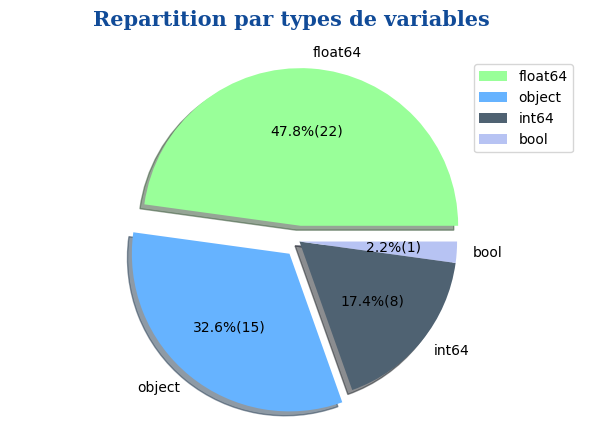

,Types de variables,Nombre
0,float64,22
1,object,15
2,int64,8
3,bool,1


In [7]:
# Affichage des types de variables dans la base.
repartitionTypeVar(dfBuild,figsize=(6, 4),graphName='RepartitionTypeVar.png')

### Taux de complétion

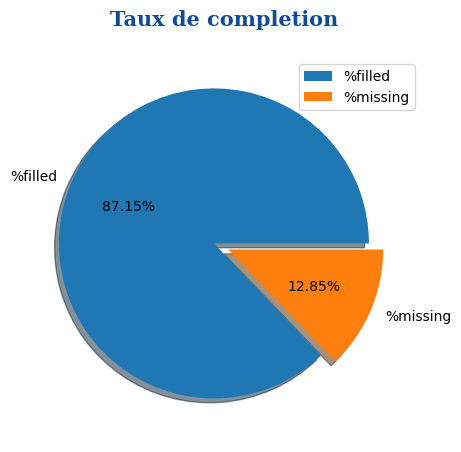

In [8]:
def fillingRate(data, grahName=''):   
    filled =data.notna().sum().sum()/(data.shape[0]*data.shape[1])
    missing =data.isna().sum().sum()/(data.shape[0]*data.shape[1])

    taux = [filled, missing]
    labels = ["%filled", "%missing"]
    
    fig, ax = plt.subplots(figsize=(5, 5))
    plt.title("Taux de completion \n", fontdict=font_title)
    ax.axis("equal")
    explode = (0.1, 0)
    ax.pie(taux, explode=explode, labels=labels, autopct='%1.2f%%', shadow=True,)
    plt.legend(labels)
    if grahName!='':
        plt.savefig(imgPath+grahName, bbox_inches='tight')  
    plt.show() 
    plt.close()

fillingRate(dfBuild, 'tauxCompletion.png')

<AxesSubplot: >

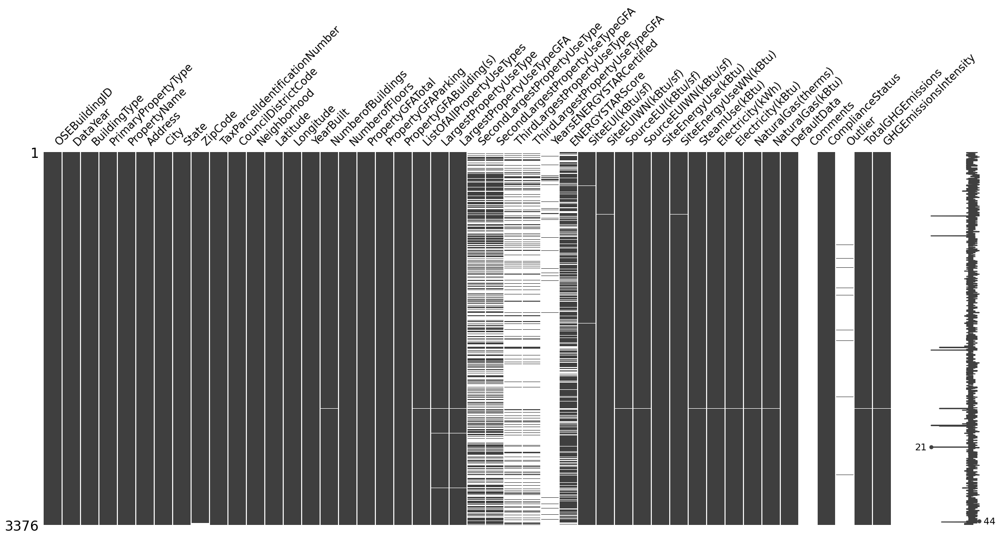

In [9]:
msno.matrix(dfBuild)

##### <font color="#337da4"><h4> 2.2. Regroupement des variables</h4><a class="anchor" id="2.2"></a></font>

In [10]:
dfBuild.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'Comments', 'ComplianceStatus',
       'Outlier

In [11]:
# 1. Identification du batiments et localisation
Identity=dfBuild.loc[:,'OSEBuildingID':'YearBuilt'].columns.tolist() 
Identity

['OSEBuildingID',
 'DataYear',
 'BuildingType',
 'PrimaryPropertyType',
 'PropertyName',
 'Address',
 'City',
 'State',
 'ZipCode',
 'TaxParcelIdentificationNumber',
 'CouncilDistrictCode',
 'Neighborhood',
 'Latitude',
 'Longitude',
 'YearBuilt']

In [12]:
# 2. Informations sur le type de batiments et style de construction et usages
Infos=dfBuild.loc[:,'NumberofBuildings':'ThirdLargestPropertyUseTypeGFA'].columns.tolist() 
Infos

['NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA']

In [13]:
# 3. consommation energie
Energy=list(set(dfBuild.loc[:,'YearsENERGYSTARCertified':'Outlier'].columns.tolist())-set(['DefaultData', 'Outlier']))
Energy

['SteamUse(kBtu)',
 'YearsENERGYSTARCertified',
 'SiteEnergyUseWN(kBtu)',
 'SourceEUIWN(kBtu/sf)',
 'ComplianceStatus',
 'ENERGYSTARScore',
 'SiteEUIWN(kBtu/sf)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'SiteEnergyUse(kBtu)',
 'Comments',
 'SiteEUI(kBtu/sf)',
 'NaturalGas(kBtu)',
 'SourceEUI(kBtu/sf)',
 'NaturalGas(therms)']

In [14]:
# 4. Emission de gaz a effet de serre
GES=dfBuild.loc[:,'TotalGHGEmissions': 'GHGEmissionsIntensity'].columns.tolist() 
GES

['TotalGHGEmissions', 'GHGEmissionsIntensity']

In [15]:
# 5. Autres varibles diverses
Others=['DefaultData', 'Outlier']
Others

['DefaultData', 'Outlier']

## <a id='3'> <font color='#114b98' font-size='110%' text-align='left'>3 - Nettoyage </font> </a>
------
[Back to table of content](#-1) <br>

Dans le libellé du projet, il est dit  que seuls les bâtiments non destinés à l'habitation sont concernés. De ce fait, nous allons faire un filtre sur le type de Batiment (***BuildingType***).


### <font color='#337da4' font-size='90%' text-align='left'> 3.1. Filtre sur les types de Bâtiments <a id="3.1"></a></font>

In [16]:
freqSimple2(dfBuild,['BuildingType'])
dfBuild['BuildingType'].unique()

------------------------------------

#### Fréquence sur la variable ***BuildingType***

------------------------------------

,BuildingType,Nombre,Frequence,Freq. cumul
0,NonResidential,1460,0.432464,0.432464
1,Multifamily LR (1-4),1018,0.301540,0.734005
2,Multifamily MR (5-9),580,0.171801,0.905806
3,Multifamily HR (10+),110,0.032583,0.938389
4,SPS-District K-12,98,0.029028,0.967417
5,Nonresidential COS,85,0.025178,0.992595
6,Campus,24,0.007109,0.999704
7,Nonresidential WA,1,0.000296,1.000000


array(['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)',
       'SPS-District K-12', 'Campus', 'Multifamily LR (1-4)',
       'Multifamily HR (10+)', 'Nonresidential WA'], dtype=object)

In [17]:
def filtreModalite(dataframe, var, modalite, keep=True) :
    ''' Cette fonction permet faire un filtre sur un dataframe. 
    Elle retourne le dataframe en prenant en compte les modalités en entrée'''
    if keep==True:
        dataframe = dataframe.loc[dataframe[var].isin(modalite),:]
    else:
        dataframe = dataframe.loc[~(dataframe[var].isin(modalite)),:]
    return dataframe

In [18]:
NotHabitation=['NonResidential', 'Nonresidential COS','SPS-District K-12', 
               'Campus', 'Nonresidential WA']
dfBuild=filtreModalite(dfBuild, 'BuildingType', NotHabitation)
dfBuild['BuildingType'].unique()

array(['NonResidential', 'Nonresidential COS', 'SPS-District K-12',
       'Campus', 'Nonresidential WA'], dtype=object)

In [19]:
freqSimple2(dfBuild,['PrimaryPropertyType'])
dfBuild['PrimaryPropertyType'].unique()

------------------------------------

#### Fréquence sur la variable ***PrimaryPropertyType***

------------------------------------

,PrimaryPropertyType,Nombre,Frequence,Freq. cumul
0,Small- and Mid-Sized Office,292,0.175060,0.175060
1,Other,250,0.149880,0.324940
2,Warehouse,187,0.112110,0.437050
3,Large Office,173,0.103717,0.540767
4,K-12 School,139,0.083333,0.624101
5,Mixed Use Property,114,0.068345,0.692446
6,Retail Store,91,0.054556,0.747002
7,Hotel,76,0.045564,0.792566
8,Worship Facility,71,0.042566,0.835132
9,Distribution Center,53,0.031775,0.866906


array(['Hotel', 'Other', 'Mixed Use Property', 'K-12 School',
       'University', 'Small- and Mid-Sized Office',
       'Self-Storage Facility', 'Warehouse', 'Large Office',
       'Senior Care Community', 'Medical Office', 'Retail Store',
       'Hospital', 'Residence Hall', 'Distribution Center',
       'Worship Facility', 'Supermarket / Grocery Store', 'Laboratory',
       'Refrigerated Warehouse', 'Restaurant', 'Low-Rise Multifamily',
       'Office'], dtype=object)

In [20]:
freqSimple2(dfBuild,['LargestPropertyUseType'])
dfBuild['LargestPropertyUseType'].unique()

------------------------------------

#### Fréquence sur la variable ***LargestPropertyUseType***

------------------------------------

,LargestPropertyUseType,Nombre,Frequence,Freq. cumul
0,Office,497,0.297962,0.297962
1,Non-Refrigerated Warehouse,199,0.119305,0.417266
2,K-12 School,139,0.083333,0.500600
3,Retail Store,99,0.059353,0.559952
4,Other,98,0.058753,0.618705
5,Hotel,76,0.045564,0.664269
6,Worship Facility,71,0.042566,0.706835
7,Distribution Center,54,0.032374,0.739209
8,Supermarket/Grocery Store,41,0.024580,0.763789
9,Medical Office,41,0.024580,0.788369


array(['Hotel', 'Police Station', 'Other - Entertainment/Public Assembly',
       'Library', 'Fitness Center/Health Club/Gym', 'Social/Meeting Hall',
       'Courthouse', 'Other', 'K-12 School', 'College/University',
       'Automobile Dealership', 'Office', 'Self-Storage Facility',
       'Non-Refrigerated Warehouse', 'Other - Mall',
       'Senior Care Community', 'Medical Office', 'Retail Store',
       'Hospital (General Medical & Surgical)', 'Museum',
       'Repair Services (Vehicle, Shoe, Locksmith, etc)',
       'Other - Lodging/Residential', 'Residence Hall/Dormitory',
       'Other/Specialty Hospital', 'Financial Office',
       'Distribution Center', 'Parking', 'Multifamily Housing',
       'Worship Facility', 'Restaurant', 'Data Center', 'Laboratory',
       'Supermarket/Grocery Store', 'Convention Center',
       'Urgent Care/Clinic/Other Outpatient', nan, 'Other - Services',
       'Strip Mall', 'Wholesale Club/Supercenter',
       'Refrigerated Warehouse', 'Manufacturing

In [21]:
dfBuild=filtreModalite(dfBuild, 'PrimaryPropertyType', ['Low rise Multifamily'],keep=False)
dfBuild=filtreModalite(dfBuild, 'LargestPropertyUseType', ['Multifamily Housing'],keep=False)

<div class="warning" style="color:#4F6272;font-size:107%;text-align:left;  padding-top: 5px;  padding-left: 5px;  padding-right: 5px; padding-bottom: 5px; margin-bottom: 5px; border-top: solid gray 5px; border-bottom: solid gray 2px;border-radius: 30px 30px;padding-right: 10px;">
    <span>
        <p style='margin-left:0.9em;margin-right:0.9em;'>
            Nous allons garder uniquement les batiments <b><i> qui ne sont pas à usage d'habitation </i></b>.
        </p>
    </span>
</div>

In [22]:
dfBuild.dropna(subset=['ENERGYSTARScore'],inplace=True)

<div class="warning" style="color:#4F6272;font-size:107%;text-align:left;  padding-top: 5px;  padding-left: 5px;  padding-right: 5px; padding-bottom: 5px; margin-bottom: 5px; border-top: solid gray 5px; border-bottom: solid gray 2px;border-radius: 30px 30px;padding-right: 10px;">
    <span>
        <p style='margin-left:0.9em;margin-right:0.9em;'>
            Nous allons restreindre les données aux batiments  pour lesquels la variable <b><i> "ENERGYSTARScore" est renseignée </i></b>. Ceci nous permettra de tester efficacement l'importance de cette variable. 
        </p>
    </span>
</div>

In [23]:
indexToDrop=dfBuild[dfBuild['TotalGHGEmissions']==0].index
dfBuild.drop(indexToDrop,inplace=True)

In [24]:
indexToDrop=dfBuild[dfBuild['SiteEnergyUse(kBtu)']==0].index
format_mapping = {"count": "N{:.0f}", "mean": "{:.1f}", "std": "{:.2f}", "min": "{:.2f}",
                  "25%": "{:.2f}", "50%": "{:.2f}", "75%": "{:.2f}","max": "{:.0f}"} # ,"max": "{:.0f}%"
df=dfBuild[['SiteEnergyUse(kBtu)']].describe().T
df.style.format(format_mapping)


,count,mean,std,min,25%,50%,75%,max
SiteEnergyUse(kBtu),N1088,8371553.9,24786730.04,79711.80,1285178.97,2665526.12,7266775.00,448385312


<div class="warning" style="color:#4F6272;font-size:107%;text-align:left;  padding-top: 5px;  padding-left: 5px;  padding-right: 5px; padding-bottom: 5px; margin-bottom: 5px; border-top: solid gray 5px; border-bottom: solid gray 2px;border-radius: 30px 30px;padding-right: 10px;">
    <span>
        <p style='margin-left:0.9em;margin-right:0.9em;'>
            Nous avons supprimé les lignes pour lesquelles <b><i> "SiteEnergyUse(kBtu)" est ==0 </i></b>. <br>
            Nos variables d'interêt (<b><i>target</i></b>) seront <b><i>SiteEnergyUse(kBtu) & TotalGHGEmissions</i></b>.
        </p>
    </span>
</div>

### <font color='#337da4' font-size='90%' text-align='left'> 3.2. Suppression de colonnes <a id="3.2"></a></font>

In [25]:
# Age des batiments
dfBuild['BuildAge'] = dfBuild['DataYear'] - dfBuild['YearBuilt']
dfBuild['BuildAge'].describe().reset_index().T

,0,1,2,3,4,5,6,7
index,count,mean,std,min,25%,50%,75%,max
BuildAge,1088.0,52.567096,31.783495,1.0,27.0,48.5,78.0,116.0


In [26]:
AgeRange=[(0, 10), (10, 20), (20, 30), (30, 40), (40, 50),(50, 60), (60, 70), (70,80), (80,90), 
          (90,100), (100,110), (110,120)]
bins = pd.IntervalIndex.from_tuples(AgeRange)
dfBuild['BuildAgeGroup'] = pd.cut(dfBuild['BuildAge'], bins)
dfBuild.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,BuildAge,BuildAgeGroup
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83,89,"(80, 90]"
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86,20,"(10, 20]"
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19,47,"(40, 50]"
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67,90,"(80, 90]"
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88,36,"(30, 40]"


In [27]:
# Les colonnes avec des WN, des corrections liées au climat (weather normalised)
def searchfeature(data, suffix):
    varList=[col for col in data.columns if suffix in col]
    return varList

varList=searchfeature(dfBuild, 'WN')
dfBuild.drop(varList,axis=1,inplace=True)
varList

['SiteEUIWN(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu)']

In [28]:
# Certaines colonnes sont redondantes
redondatesfeatures = ['NaturalGas(therms)','Electricity(kWh)']
dfBuild.drop(redondatesfeatures, axis=1, inplace=True)

In [29]:
# Certaines colonnes sont constantes ou difficiles a exploiter
dfBuild.drop(['State','Comments','ZipCode','City','DataYear','OSEBuildingID', 'TaxParcelIdentificationNumber'], 
             axis=1, inplace=True)

### <font color='#337da4' font-size='90%' text-align='left'> 3.3. Consistance des données <a id="3.3"></a></font>

In [30]:
dfBuild.min()

BuildingType                                                              Campus
PrimaryPropertyType                                          Distribution Center
PropertyName                                                    #4706 Bitterlake
Address                                                          10 Harrison St.
CouncilDistrictCode                                                            1
Neighborhood                                                             BALLARD
Latitude                                                                47.49917
Longitude                                                             -122.41182
YearBuilt                                                                   1900
NumberofBuildings                                                            0.0
NumberofFloors                                                                 0
PropertyGFATotal                                                           12294
PropertyGFAParking          

-----
Nous avons des valeurs negatives pour certaines variables comme:***TotalGHGEmissions, GHGEmissionsIntensity,Electricity(kBtu)***    

---------------

In [31]:
dfBuild.loc[((dfBuild['TotalGHGEmissions']<0)|(dfBuild['GHGEmissionsIntensity']<0)|(dfBuild['Electricity(kBtu)']<0)),:]

,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,...,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,BuildAge,BuildAgeGroup
3206,NonResidential,Small- and Mid-Sized Office,Bullitt Center,1501 E. Madison St.,3,CENTRAL,47.61432,-122.31257,2013,1.0,...,0.0,-115417.0,0.0,False,Compliant,NaN,-0.8,-0.02,3,"(0, 10]"


In [32]:
# pd.set_option('display.precision', 1)
# pd.options.display.float_format = "{:.1f}".format
format_mapping = {"count": "N{:.0f}", "mean": "{:,.2f}", "std": "{:,.2f}", "min": "{:,.2f}",
                  "25%": "{:,.2f}", "50%": "{:,.2f}", "75%": "{:,.2f}","max": "{:.0f}"} # ,"max": "{:.0f}%"

df=dfBuild.describe().T
for key, value in format_mapping.items():
    df[key] =df[key].apply(value.format)

df.style.format(format_mapping)
df

,count,mean,std,min,25%,50%,75%,max
CouncilDistrictCode,N1088,4.40,2.19,1.00,2.00,4.00,7.00,7
Latitude,N1088,47.62,0.05,47.50,47.58,47.61,47.65,48
Longitude,N1088,-122.33,0.02,-122.41,-122.34,-122.33,-122.32,-122
YearBuilt,N1088,"1,963.43",31.78,"1,900.00","1,938.00","1,967.50","1,989.00",2015
NumberofBuildings,N1088,1.02,0.51,0.00,1.00,1.00,1.00,9
NumberofFloors,N1088,4.84,7.80,0.00,1.00,3.00,5.00,99
PropertyGFATotal,N1088,"124,642.72","202,401.39","12,294.00","32,194.25","54,113.00","124,138.75",1952220
PropertyGFAParking,N1088,"15,108.45","45,778.79",0.00,0.00,0.00,0.00,512608
PropertyGFABuilding(s),N1088,"109,534.28","176,148.37","3,636.00","30,764.75","51,367.00","106,160.50",1765970
LargestPropertyUseTypeGFA,N1086,"104,137.33","165,968.27","8,061.00","28,750.50","49,871.50","103,461.00",1680937


In [33]:
dfBuild.loc[dfBuild['NaturalGas(kBtu)']==0,:]

,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,...,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,BuildAge,BuildAgeGroup
44,NonResidential,Large Office,5th and Pine,413 Pine Street,7,DOWNTOWN,47.61130,-122.33659,1973,1.0,...,0.0,9.536160e+06,0.0,False,Compliant,NaN,66.48,0.40,43,"(40, 50]"
46,NonResidential,Small- and Mid-Sized Office,Gibraltar Tower,1520 3rd Ave,7,DOWNTOWN,47.61048,-122.33794,1910,1.0,...,0.0,5.071973e+06,0.0,False,Compliant,NaN,35.36,0.60,106,"(100, 110]"
84,NonResidential,Small- and Mid-Sized Office,2100 Building,2100 24th Ave S,3,SOUTHEAST,47.58408,-122.30125,2003,1.0,...,0.0,4.897760e+06,0.0,False,Compliant,NaN,34.14,0.34,13,"(10, 20]"
99,SPS-District K-12,K-12 School,West Woodland Elementary,5601 4th Ave. N.W.,6,Ballard,47.67060,-122.36225,1991,1.0,...,0.0,1.513571e+06,0.0,True,Error - Correct Default Data,NaN,10.55,0.19,25,"(20, 30]"
160,NonResidential,Warehouse,Harbor Island: Warehouse E - DNRP-SWD,3235 16TH AVE SW,1,GREATER DUWAMISH,47.57507,-122.35747,1916,0.0,...,0.0,2.411402e+06,0.0,False,Compliant,NaN,16.81,0.21,100,"(90, 100]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3221,NonResidential,Hotel,Hotel Ballard,5216 Ballard Ave NW,6,BALLARD,47.66629,-122.38260,2013,1.0,...,0.0,3.497215e+06,0.0,False,Compliant,NaN,24.38,0.39,3,"(0, 10]"
3264,NonResidential,Hospital,Virginia Mason Medical Center - 2149,925 Seneca St.,3,EAST,47.60986,-122.32774,1920,1.0,...,73885472.0,9.006050e+07,0.0,False,Compliant,NaN,6330.91,16.91,96,"(90, 100]"
3279,NonResidential,Residence Hall,Mercer Hall,1009 NE Pacific St,4,NORTHEAST,47.65447,-122.31733,1970,1.0,...,0.0,6.960904e+06,0.0,False,Compliant,NaN,48.53,0.54,46,"(40, 50]"
3347,NonResidential,K-12 School,Hamlin Robinson School,1701 20th Ave South,3,GREATER DUWAMISH,47.58831,-122.30650,2015,1.0,...,0.0,1.325973e+06,0.0,False,Compliant,NaN,9.24,0.21,1,"(0, 10]"


In [34]:
dfBuild.loc[dfBuild['SiteEnergyUse(kBtu)']==0,:] # to delete


,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,...,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,BuildAge,BuildAgeGroup


In [35]:
dfBuild.loc[dfBuild['TotalGHGEmissions']==0,:]

,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,...,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,BuildAge,BuildAgeGroup


In [36]:
dfBuild=dfBuild.loc[dfBuild['SiteEnergyUse(kBtu)']>0,:]
dfBuild=dfBuild.loc[dfBuild['TotalGHGEmissions']>0,:]

In [37]:
dfi.export(dfBuild.loc[dfBuild['NumberofFloors']==99,'BuildingType':'NumberofFloors'], imgPath+'dfFloors99.png')
dfBuild.loc[dfBuild['NumberofFloors']==99,'BuildingType':'NumberofFloors']

,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors
1359,NonResidential,Worship Facility,Seattle Chinese Baptist Church,5801 Beacon Avenue South,2,GREATER DUWAMISH,47.55072,-122.30265,1977,1.0,99


In [38]:
dfBuild.loc[dfBuild['NumberofFloors']==99,'NumberofFloors']=2
# https://www.instantstreetview.com/

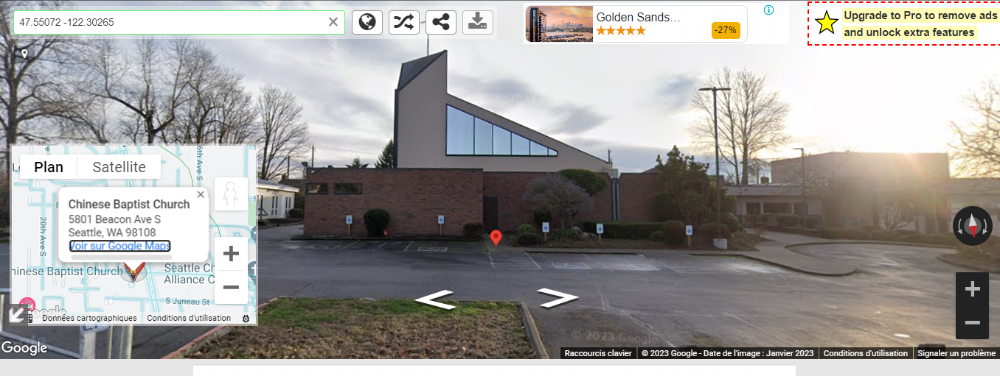

#### <font color='#337da4' font-size='90%' text-align='left'> Controle sur les surfaces des batiments </font>

In [39]:
dfBuild.loc[(dfBuild['PropertyGFATotal']>(dfBuild['PropertyGFAParking'] + dfBuild['PropertyGFABuilding(s)'])).index,:]

,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,...,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,BuildAge,BuildAgeGroup
0,NonResidential,Hotel,Mayflower park hotel,405 Olive way,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,...,2003882.00,3.946027e+06,1.276453e+06,False,Compliant,NaN,249.98,2.83,89,"(80, 90]"
1,NonResidential,Hotel,Paramount Hotel,724 Pine street,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,...,0.00,3.242851e+06,5.145082e+06,False,Compliant,NaN,295.86,2.86,20,"(10, 20]"
2,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,...,21566554.00,4.952666e+07,1.493800e+06,False,Compliant,NaN,2089.28,2.19,47,"(40, 50]"
3,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,...,2214446.25,2.768924e+06,1.811213e+06,False,Compliant,NaN,286.43,4.67,90,"(80, 90]"
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,...,0.00,5.368607e+06,8.803998e+06,False,Compliant,NaN,505.01,2.88,36,"(30, 40]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3339,NonResidential,Small- and Mid-Sized Office,Airport - Main Terminal,7277 Perimeter Rd.,2,GREATER DUWAMISH,47.53161,-122.29944,1929,1.0,...,0.00,2.167029e+06,2.253621e+06,False,Compliant,NaN,134.80,5.39,87,"(80, 90]"
3347,NonResidential,K-12 School,Hamlin Robinson School,1701 20th Ave South,3,GREATER DUWAMISH,47.58831,-122.30650,2015,1.0,...,0.00,1.325973e+06,0.000000e+00,False,Compliant,NaN,9.24,0.21,1,"(0, 10]"
3366,Nonresidential COS,Office,Central West HQ / Brown Bear,1403 w howe,7,MAGNOLIA / QUEEN ANNE,47.63572,-122.37525,1952,1.0,...,0.00,5.026678e+05,0.000000e+00,True,Error - Correct Default Data,NaN,3.50,0.26,64,"(60, 70]"
3369,Nonresidential COS,Office,Genesee/SC SE HQ,4420 S Genesee,2,SOUTHEAST,47.56440,-122.27813,1960,1.0,...,0.00,2.775369e+05,1.102730e+05,True,Error - Correct Default Data,NaN,7.79,0.51,56,"(50, 60]"


In [40]:
dfBuild[['PropertyGFATotal','PropertyGFAParking','PropertyGFABuilding(s)']]
dfBuild.loc[dfBuild['PropertyGFATotal']<dfBuild[['PropertyGFAParking','PropertyGFABuilding(s)']].sum(axis=1),:]

,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,...,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),DefaultData,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,BuildAge,BuildAgeGroup


#### <font color='#337da4' font-size='90%' text-align='left'> Localisation des batiments </font>

----------
Comme la carte le montre, tous les batiments se trouvent à Seattle, ce qui signifie que les données adress (Longitude, Lattitude) sont correctes. 

In [41]:
import folium
map_data = folium.Map()
map_data = folium.Map(location=[dfBuild['Latitude'].mean(), dfBuild['Longitude'].mean()],zoom_start=11)
for i in range(0,len(dfBuild)):
    folium.Circle([dfBuild.iloc[i]['Latitude'],dfBuild.iloc[i]['Longitude']], 
                      popup=dfBuild.iloc[i]['Address'], radius =100).add_to(map_data)
map_data

### <font color='#337da4' font-size='90%' text-align='left'> 3.4. Données manquantes et imputation <a id="3.4"></a></font>

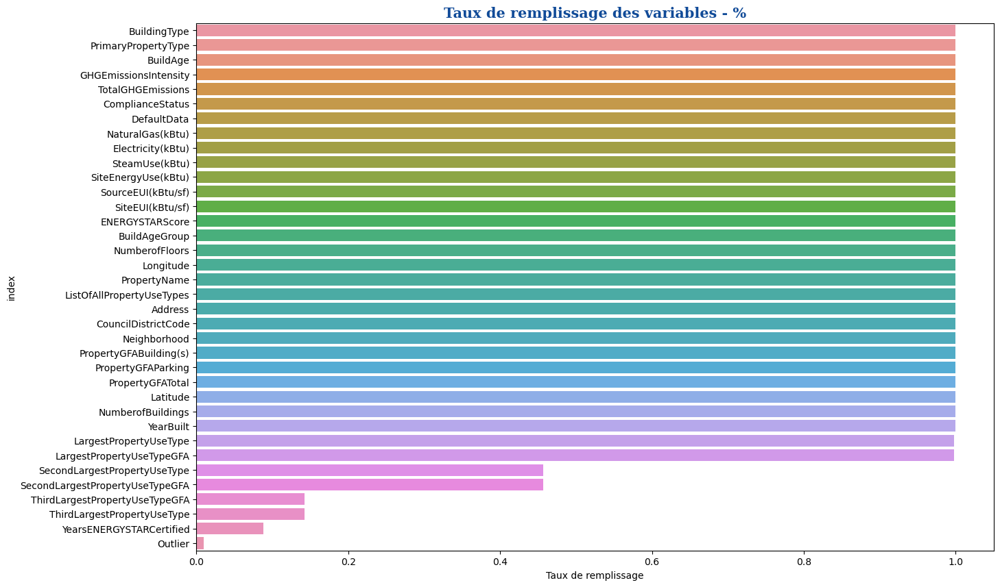

In [42]:
def tauxRemplissageVariable(dataframe):
  # Répartition du taux de remplissage des colonnes: 
    df = (pd.DataFrame(round(dataframe.shape[0] - dataframe.isna().sum())/dataframe.shape[0],
                 columns=['Taux de remplissage']).sort_values('Taux de remplissage', ascending=False).reset_index())
    fig, ax = plt.subplots(figsize=(15,10))
    sns.barplot(y=df['index'], x='Taux de remplissage', data=df)
    plt.title('Taux de remplissage des variables - %', fontdict = font_title)
    plt.show()
    
tauxRemplissageVariable(dfBuild)

In [43]:
def ImputeNaN(data, var, value):
    data[var].fillna(0, inplace=True)
    data[var].replace(0, value, inplace=True)
    return data

dfBuild=ImputeNaN(dfBuild, 'NumberofBuildings', 1)
dfBuild=ImputeNaN(dfBuild, 'NumberofFloors', 1)

In [44]:
dfBuild['NumberofBuildings'].value_counts(dropna=False)

1.0    1074
2.0       3
4.0       2
6.0       2
5.0       2
9.0       1
7.0       1
3.0       1
8.0       1
Name: NumberofBuildings, dtype: int64

In [45]:
# Supprimer les colonnes entierement vides
dfBuild = dfBuild.dropna(axis = 1, how = 'all')

# supprimer les variables avec un grand nombre de valeurs manquantes
def DeleteMissingValue(data, threshold, cols=''):
    if cols=='':
        listeCols=data.columns.tolist()
    else:
        listeCols=cols
    pct_null = data[listeCols].isnull().sum() / len(data)
    missing_features = pct_null[pct_null > threshold].index
    data.drop(missing_features, axis=1, inplace=True)
    
DeleteMissingValue(dfBuild, 0.50)

<div class="warning" style="color:#4F6272;font-size:100%;text-align:left;  padding-top: 5px;  padding-left: 5px;  padding-right: 5px; padding-bottom: 10px; margin-bottom: 5px; border-top: solid gray 5px; border-bottom: solid gray 2px;border-radius: 30px 30px;padding-right: 10px;">
<span> 
<p style='margin-left:0.9em;'>
    Nous avons supprimé toutes les colonnes ayant un taux de missings  <b><i> supérieur au seuil de 50% </i></b>. Ce choix est arbitaire. Par la suite, nous procederons à une imputation avant toute analyse. </p>
</span>
</div>

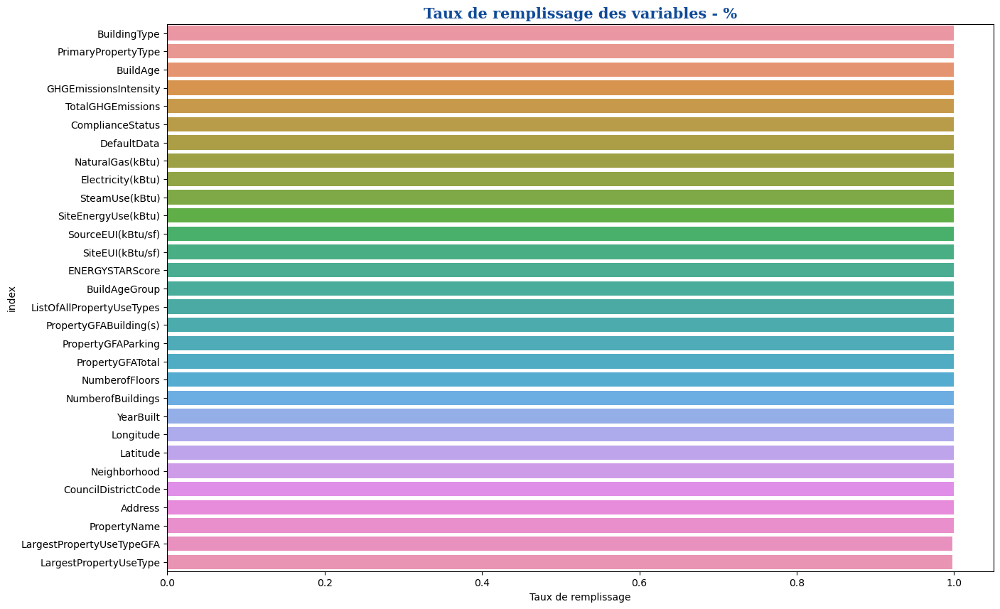

In [46]:
tauxRemplissageVariable(dfBuild)

<AxesSubplot: >

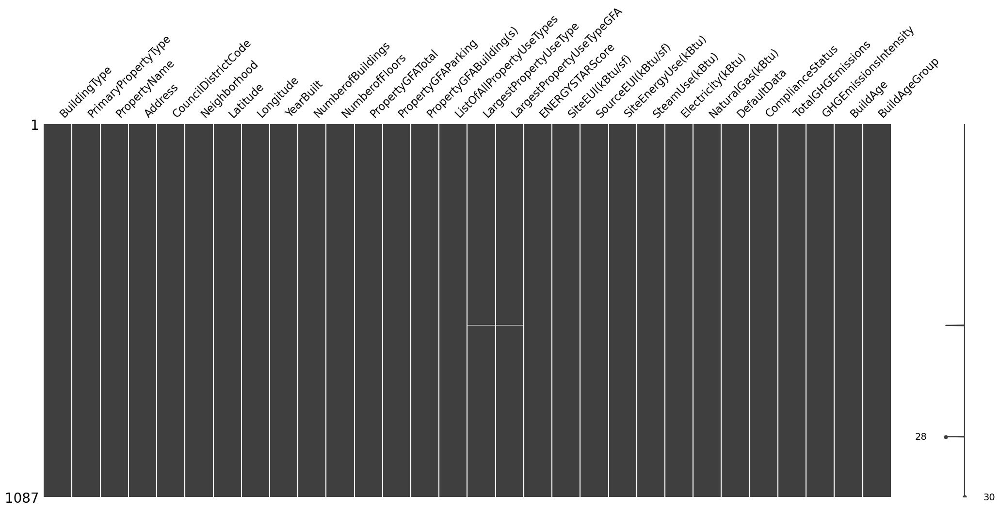

In [47]:
msno.matrix(dfBuild)

In [48]:
dfBuild[dfBuild.isna().any(axis=1)][['BuildingType','PrimaryPropertyType','PropertyName','Address',
                                     'CouncilDistrictCode','Neighborhood','LargestPropertyUseType',
                                     'LargestPropertyUseTypeGFA']]
# dfBuild.isna().any()
dfBuild.dropna(subset=['LargestPropertyUseType'],inplace=True)

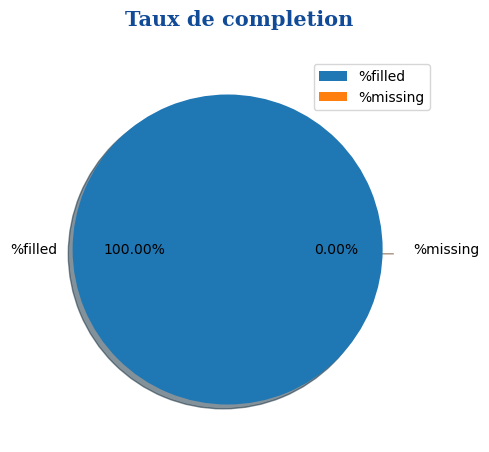

In [49]:
fillingRate(dfBuild, 'tauxCompletion2.png')

### <font color='#337da4' font-size='90%' text-align='left'> 3.5. Typage des variables <a id="3.5"></a></font>

In [50]:
def typage(dataframe):
    for feature in int_features:
        if feature in dataframe.columns.to_list() :
            dataframe[feature] = dataframe[feature].astype('int64')

    for feature in float_features:
        if feature in dataframe.columns.to_list() :
            dataframe[feature] = dataframe[feature].astype('float64')

    for feature in object_features:
        if feature in dataframe.columns.to_list() :
            dataframe[feature] = dataframe[feature].astype('object')

    # for feature in date_features:
    #     if feature in dataframe.columns.to_list() :
    #         dataframe[feature] = dataframe[feature].astype('datetime64[ns]')
            
    return dataframe

In [51]:
category_features=['BuildingType', 'YearBuilt', 'Neighborhood', 'PrimaryPropertyType', 'Neighborhood']
int_features=['NumberofBuildings', 'NumberofFloors']
float_features=['PropertyGFATotal']
object_features=['PropertyName', 'Address', 'ListOfAllPropertyUseTypes', 'LargestPropertyUseType','ComplianceStatus']
dfBuild=typage(dfBuild)

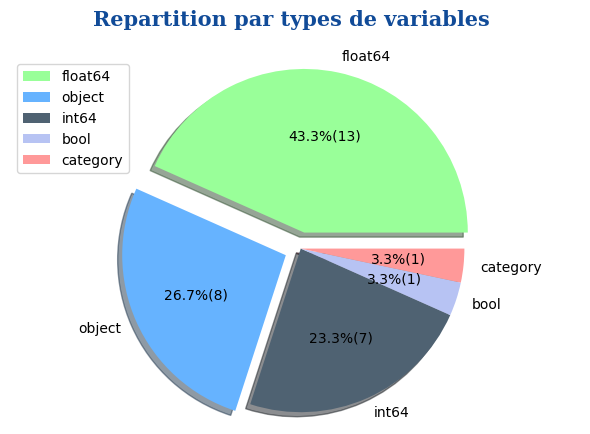

,Types de variables,Nombre
0,float64,13
1,object,8
2,int64,7
3,bool,1
4,category,1


In [52]:
# Affichage des types de variables dans la base.
repartitionTypeVar(dfBuild,figsize=(6, 4),graphName='RepartitionTypeVar2.png')

### <font color='#337da4' font-size='90%' text-align='left'> Conversion en majuscule </font>

----------

In [53]:
def majuscule(data,var) :
    data[var] = data[var].str.upper()
    return data

dfBuild=majuscule(dfBuild,'Neighborhood')
dfBuild=majuscule(dfBuild,'PropertyName')

In [54]:
dfBuild[['PropertyName','Neighborhood']].head()

,PropertyName,Neighborhood
0,MAYFLOWER PARK HOTEL,DOWNTOWN
1,PARAMOUNT HOTEL,DOWNTOWN
2,5673-THE WESTIN SEATTLE,DOWNTOWN
3,HOTEL MAX,DOWNTOWN
4,WARWICK SEATTLE HOTEL (ID8),DOWNTOWN


### <font color='#337da4' font-size='90%' text-align='left'> 3.6. Outliers ou valeurs aberrantes <a id="3.6"></a></font>

In [55]:
outliers = (dfBuild.select_dtypes(['float' , 'int'])
 .apply(lambda x:(x>plt.boxplot(x)['whiskers'][1].get_ydata()[1])|(x <plt.boxplot(x)['whiskers'][0].get_ydata()[1])))
plt.close()

In [56]:
(outliers).sum()

CouncilDistrictCode            0
Latitude                       0
Longitude                    138
YearBuilt                      0
NumberofBuildings             13
NumberofFloors                86
PropertyGFATotal             128
PropertyGFAParking           244
PropertyGFABuilding(s)       117
LargestPropertyUseTypeGFA    118
ENERGYSTARScore                0
SiteEUI(kBtu/sf)              87
SourceEUI(kBtu/sf)            80
SiteEnergyUse(kBtu)          113
SteamUse(kBtu)                75
Electricity(kBtu)            114
NaturalGas(kBtu)             121
TotalGHGEmissions            109
GHGEmissionsIntensity         87
BuildAge                       0
dtype: int64

Lower Bound : 147442.3769 Upper Bound : 155326340.79999852
Nous avons : 6  outliers


,PrimaryPropertyType,PropertyName,SiteEnergyUse(kBtu)
35,Mixed Use Property,PLANT 2 SITE,"448,385,312"
170,Hospital,HARBORVIEW MEDICAL CENTER,"293,090,784"
618,Hospital,SWEDISH FIRST HILL,"291,614,432"
558,Other,WESTINBUILDING,"274,682,208"
124,Hospital,SEATTLE CHILDREN'S HOSPITAL MAIN CAMPUS,"253,832,464"
3264,Hospital,VIRGINIA MASON MEDICAL CENTER - 2149,"163,945,984"


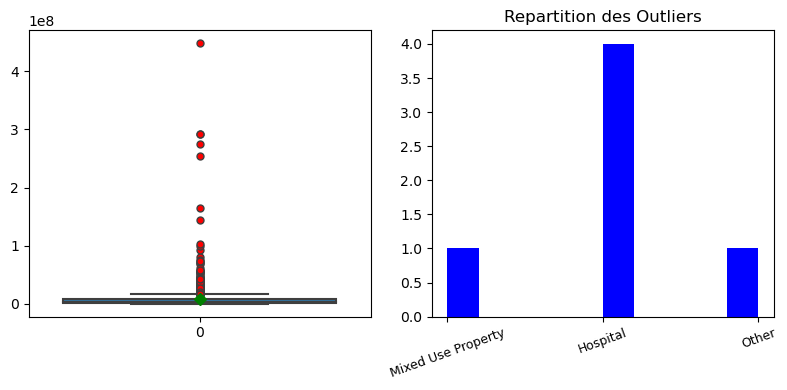

In [57]:
def OutliersDetection(data, var, level=0.99,graphName=''):
    UB= data[var].quantile(level)
    LB= data[var].quantile(1-level) # |(data[var] < LB)
    outliers = (data.loc[((data[var] > UB)),:][['PrimaryPropertyType','PropertyName']+[var]]
                .sort_values(by=[var],ascending=False))
    
    print('Lower Bound :', LB,'Upper Bound :', UB)
    print("Nous avons :", outliers.shape[0], ' outliers')
    # plt.boxplot(data[var])   
    # plt.boxplot(data[var].values,patch_artist=True,)

    format_mapping = {var: "{:,.0f}"} # ,"max": "{:.0f}%"
    display(outliers.style.format(format_mapping))
    fig = plt.figure(figsize=(8,4))

    plt.subplot(121)   #  subplot 1
    red_circle = dict(markerfacecolor='red', marker='o')
    mean_shape = dict(markerfacecolor='green', marker='D', markeredgecolor='green')
    sns.boxplot(data=data[var],flierprops=red_circle,showmeans=True, meanprops=mean_shape)

    plt.subplot(122)   #  subplot 2
    plt.title('Repartition des Outliers')
    plt.hist(data = outliers, x = 'PrimaryPropertyType',  color = 'b')
    plt.xticks(rotation=20,fontsize=9)
    plt.tight_layout()
    if graphName!='':
        graphName1='df'+graphName
        dfi.export(outliers, imgPath+graphName1)
        plt.savefig(imgPath+graphName, bbox_inches='tight')
    plt.show()
    
OutliersDetection(dfBuild, 'SiteEnergyUse(kBtu)', level=0.995,graphName='OutlierEnergy.png')    

Lower Bound : 1.12 Upper Bound : 4222.477599999882
Nous avons : 6  outliers


,PrimaryPropertyType,PropertyName,TotalGHGEmissions
35,Mixed Use Property,PLANT 2 SITE,"16,871"
618,Hospital,SWEDISH FIRST HILL,"12,307"
170,Hospital,HARBORVIEW MEDICAL CENTER,"10,735"
124,Hospital,SEATTLE CHILDREN'S HOSPITAL MAIN CAMPUS,"8,146"
3264,Hospital,VIRGINIA MASON MEDICAL CENTER - 2149,"6,331"
167,Hospital,SWEDISH CHERRY HILL,"4,906"


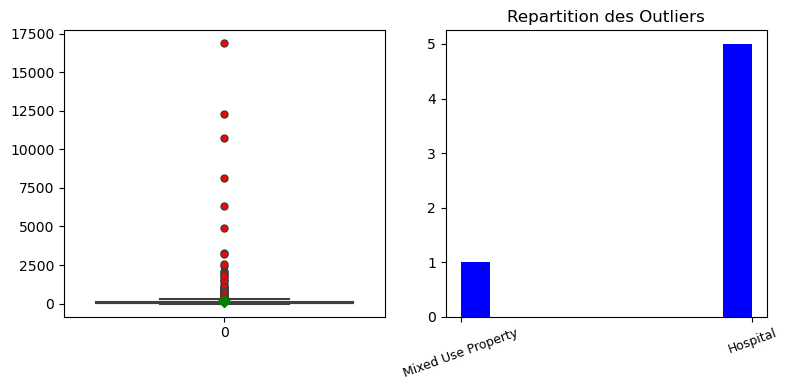

In [58]:
OutliersDetection(dfBuild, 'TotalGHGEmissions', level=0.995,graphName='OutlierCO2.png')  

In [59]:
infodfBuild=infoDataFrame(dfBuild)
dfi.export(infodfBuild, imgPath+'dfshapeAP.png') # exportation de la table en image pour les besoins de la prez


------------------------------------

#### Info générales sur la base : ['dfBuild']

------------------------------------

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1085 entries, 0 to 3371
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   BuildingType               1085 non-null   object  
 1   PrimaryPropertyType        1085 non-null   object  
 2   PropertyName               1085 non-null   object  
 3   Address                    1085 non-null   object  
 4   CouncilDistrictCode        1085 non-null   int64   
 5   Neighborhood               1085 non-null   object  
 6   Latitude                   1085 non-null   float64 
 7   Longitude                  1085 non-null   float64 
 8   YearBuilt                  1085 non-null   int64   
 9   NumberofBuildings          1085 non-null   int64   
 10  NumberofFloors             1085 non-null   int64   
 11  PropertyGFATotal           1085 non-null   float64 
 12  PropertyGFAParking         1085 non-null   int64   
 13  PropertyGFABuilding(s)     1085 n

,Variable,nombre
0,lignes,1085
1,colonnes,30


## <a id='4'> <font color='#114b98' font-size='110%' text-align='left'> 4 - Exploration </font>
-----------
[Back to table of content](#-1) <br>


### <font color='#337da4' font-size='90%' text-align='left'> 4.1. Analyse Univariée <a id="4.1"></a></font>

In [60]:
def Camembert(data,label, figsize=(12,8)):
    df = data[label].value_counts().reset_index()
    plt.figure(figsize=figsize)
    ax1 = plt.subplot(121, aspect='equal')
    df.plot(kind='pie', y=label, ax=ax1, autopct='%1.1f%%',  
     startangle=0, shadow=True, labels=df['index'], legend = False, fontsize=7)
    ax1.axis('equal')
    plt.xlabel("")
    plt.ylabel("")
    plt.show()

from statsmodels.graphics.gofplots import qqplot
def qqplotGraph(data, var):
    fig, axs = plt.subplots(1,2)
    # histogram
    axs[0].hist(data[var], histtype='stepfilled',ec='k', color='lightgrey', bins =25)
    # using statsmodels qqplot's module
    qqplot(data[var], line='r', **{'markersize': 5,'color': 'lightgrey'}, ax=axs[1])
    plt.gcf().set_size_inches(10,2.5)
    fig.suptitle(var, size=10) # , fontweight='bold'
    plt.tight_layout(rect=[0, 0.05, 1, 0.92])  

-------
Nous allons regarder les années de construction des batiments. 

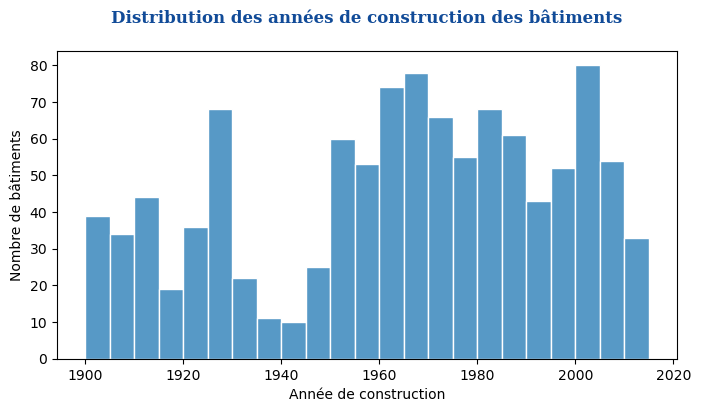

In [61]:
fig = plt.figure(figsize=(8,4))
ax = sns.histplot(data=dfBuild, x='YearBuilt', bins=int((dfBuild.YearBuilt.max() - dfBuild.YearBuilt.min())/5),
                 edgecolor='white')
ax.set_xlabel("Année de construction")
ax.set_ylabel("Nombre de bâtiments")
plt.title(f"Distribution des années de construction des bâtiments\n", fontdict=font_title2)
plt.show()

---------
Cette variable est beaucoup dispercée. De ce fait, il serait plus interessant de se pencher sur l'age du batiment en lieu et place de l'année de construction.

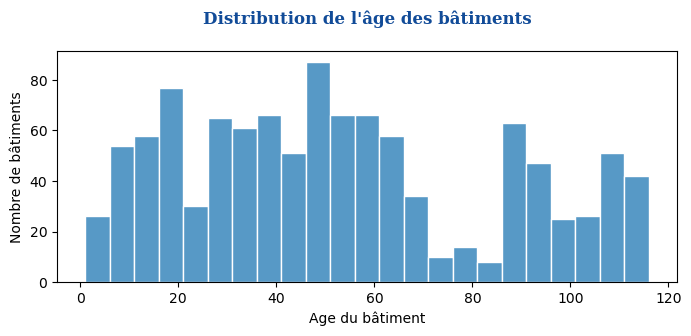

In [62]:
fig = plt.figure(figsize=(8,3))
ax = sns.histplot(data=dfBuild, x='BuildAge', bins=int((dfBuild.BuildAge.max() - dfBuild.BuildAge.min())/5),
                 edgecolor='white')
ax.set_xlabel("Age du bâtiment")
ax.set_ylabel("Nombre de bâtiments")
plt.title(f"Distribution de l'âge des bâtiments\n", fontdict=font_title2)
plt.show()

In [63]:
# Groupement des variables par types
numeric_features=selectionVar(dfBuild, typevar=np.number)
category_features=['BuildingType',  'ComplianceStatus']
quali_features=list(set(selectionVar(dfBuild, typevar=np.object))-set(category_features))
numeric_features

['CouncilDistrictCode',
 'Latitude',
 'Longitude',
 'YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kBtu)',
 'NaturalGas(kBtu)',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity',
 'BuildAge']

In [64]:

from scipy.stats import anderson
def test_AndersonDarling(data, var,seuil=1):    
    mask = data[var].notnull()
    datamask = data[mask]
    dataTest = datamask[var]
    # Application du Test d'Anderson-Darling 
    liste=list(anderson(dataTest, dist='norm')[2])
    statistic=anderson(dataTest, dist='norm')[0]
    critical_value=anderson(dataTest, dist='norm')[1][liste.index(seuil)]
    return print('Distribution normale '+var+' :',statistic<=critical_value)

def AnalyseVarGraph(data, var, grahName=''):
    plt.figure(constrained_layout=True)
    with plt.rc_context(rc={'font.family': 'serif',  'font.size': 8}): # ,'text.color':'#114b98', 'font.weight': 'bold'
        fig = plt.figure(figsize=(9,4))
        ax1 = fig.add_subplot(133)
        # ax1.set_xlabel(var,rotation=30)
        qqplot(data[var], line='r', **{'markersize': 5,'color': 'lightgrey'}, ax=ax1)
        ax1.set_xlabel('')
        ax1.set_title(var+"\n",fontdict=font_title2) # "Distrubution :"+var+"\n"
    
        ax2 = fig.add_subplot(131)
        ax2.hist(data[var], bins=15,edgecolor = 'white')
        # ax2.vlines(df[var].mean(), *ax2.get_ylim(),  color='red', ls='-', lw=1.5)
        # ax2.vlines(df[var].median(), *ax2.get_ylim(), color='green', ls='-.', lw=1.5)
        # ax2.vlines(df[var].mode()[0], *ax2.get_ylim(), color='goldenrod', ls='--', lw=1.5)
        # ax2.legend(['mean', 'median', 'mode'])
        # ax2.title.set_fontweight('bold')
        # ax2.set_xlabel(var,rotation=30)
        ax2.set_ylabel('cumulative sum')
        ax2.set_title(var+"\n",fontdict=font_title2) # "Distrubution :"+var+"\n"
        
        ax3 = fig.add_subplot(132)        
        # plt.boxplot(data[var].values,patch_artist=True,)
        red_circle = dict(markerfacecolor='red', marker='o')
        mean_shape = dict(markerfacecolor='green', marker='D', markeredgecolor='green')
        # ax3.boxplot(x=dfBuild[var], vert=True, flierprops=red_circle, 
        #              showmeans=True, meanprops=mean_shape)
        sns.boxplot(data=data[var],flierprops=red_circle,showmeans=True, meanprops=mean_shape,  ax=ax3)
        # ax3.boxplot(x=dfBuild[var], vert=True, flierprops=red_circle,showmeans=True, meanprops=mean_shape)
        # Background
        ax3.set_facecolor('0.96')
        ax3.grid(color='white')
        # ax3.axhline(8, color='black', alpha=0.4)
        # ax3.axhline(8.5, color='black', alpha=0.4)

        # ax3 = plt.gca()
        #ax3.set_ylim(dfBuild[var].min(), dfBuild[var].max())
        # ylim = ax3.set_ylim(dfBuild[var].min(), dfBuild[var].max())
        # ax3.set_xlabel(var,rotation=0)
        ax3.set_title(var+"\n",fontdict=font_title2) # "Boxplot \n"
        plt.tight_layout(w_pad=0.5, h_pad=0.65)
        plt.show()
        if grahName!='':
            plt.savefig(imgPath+grahName, dpi=400)
            # plt.savefig("normalvars.png", dpi=150)
        # with pd.option_context('display.float_format', '{:,.3f}'.format):
        #     display(test_AndersonDarling(data, var,seuil=5))



<Figure size 640x480 with 0 Axes>

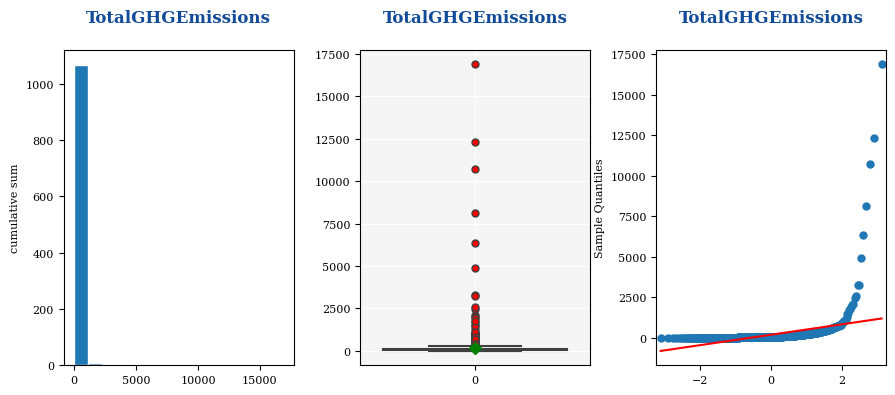

<Figure size 640x480 with 0 Axes>

In [65]:
AnalyseVarGraph(dfBuild, 'TotalGHGEmissions',grahName='UnivarCO2.png' )

<Figure size 640x480 with 0 Axes>

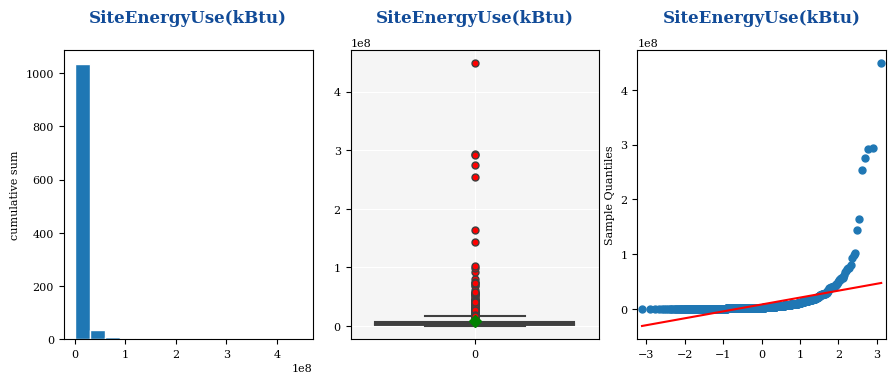

<Figure size 640x480 with 0 Axes>

In [66]:
AnalyseVarGraph(dfBuild, 'SiteEnergyUse(kBtu)',grahName='UnivarEnergy.png' )

<Figure size 640x480 with 0 Axes>

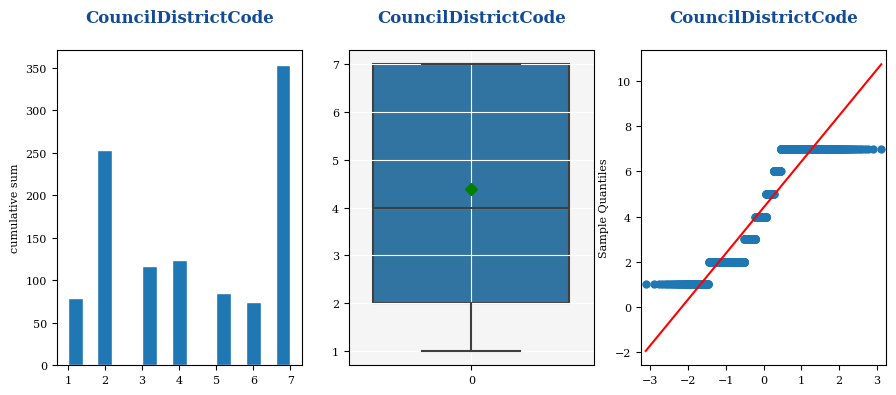

<Figure size 640x480 with 0 Axes>

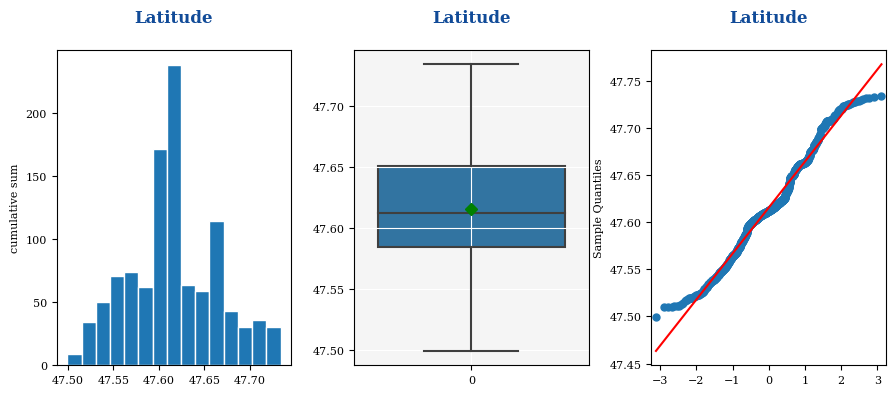

<Figure size 640x480 with 0 Axes>

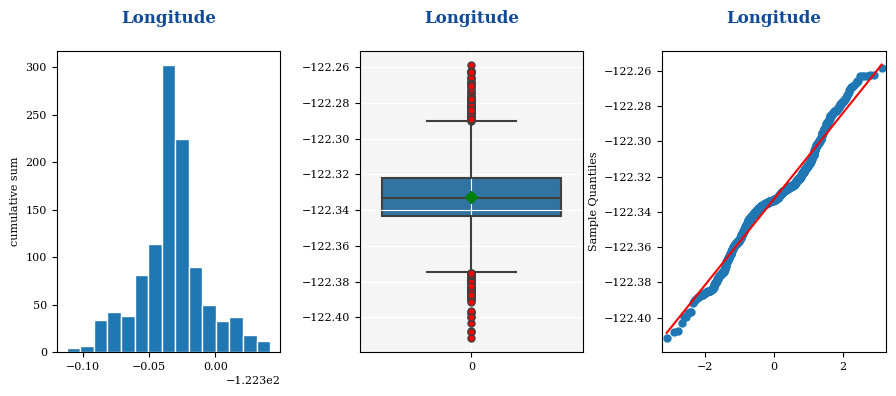

<Figure size 640x480 with 0 Axes>

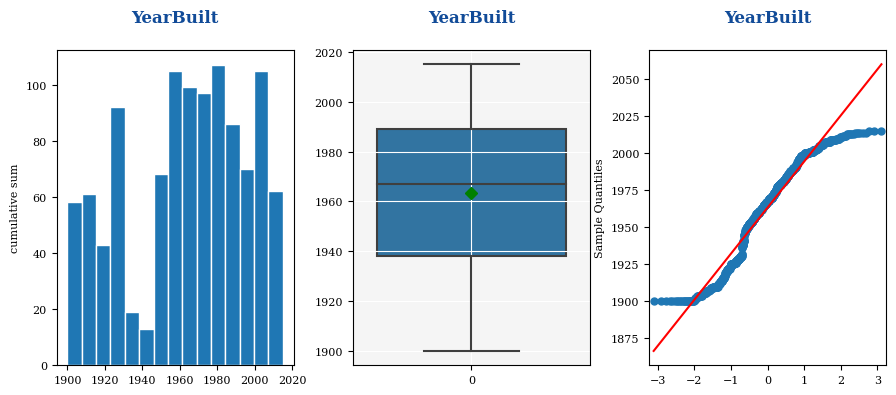

<Figure size 640x480 with 0 Axes>

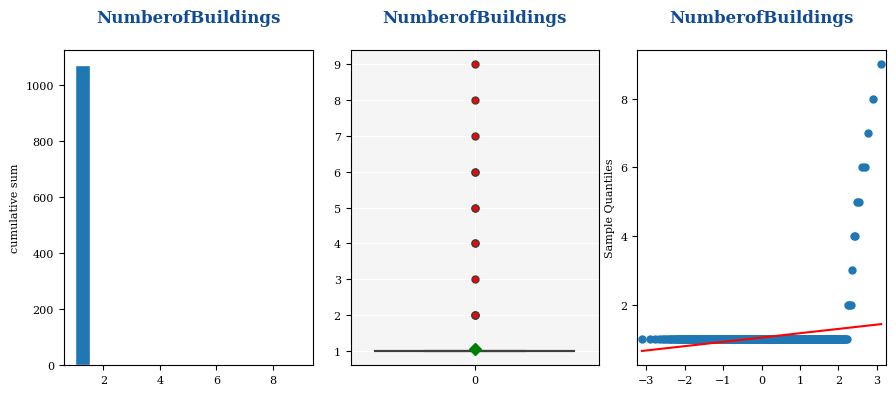

<Figure size 640x480 with 0 Axes>

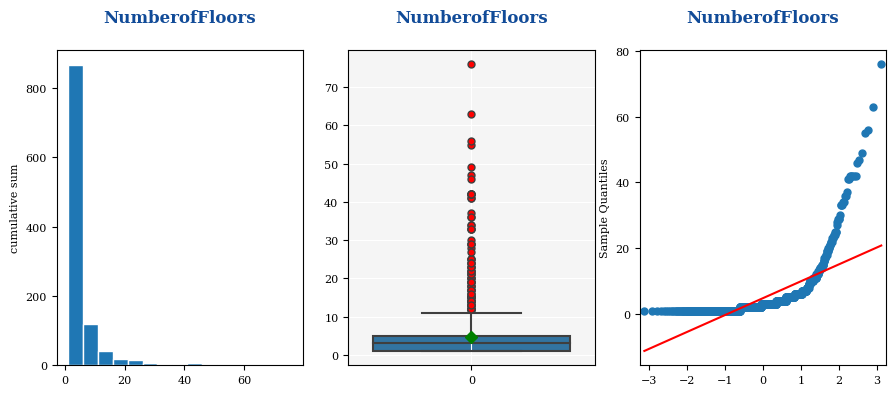

<Figure size 640x480 with 0 Axes>

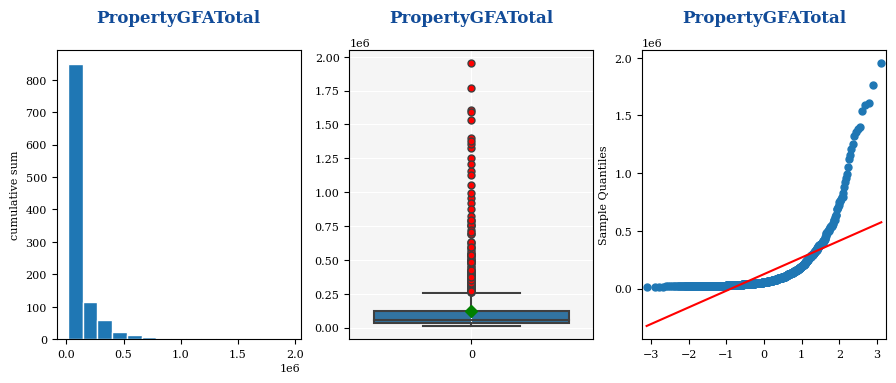

<Figure size 640x480 with 0 Axes>

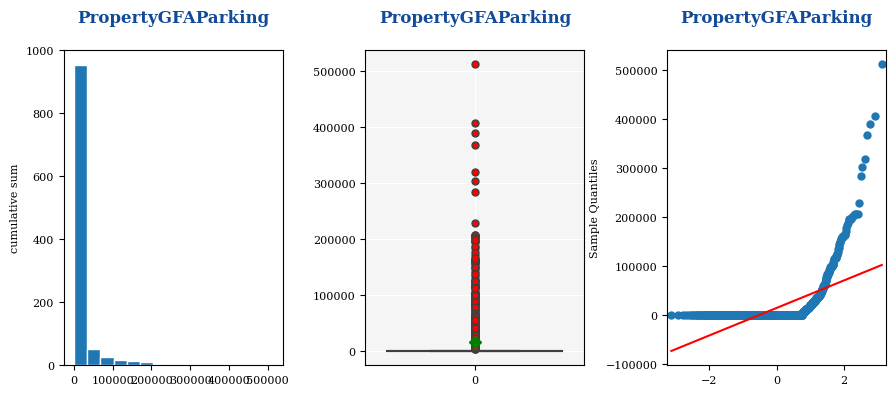

<Figure size 640x480 with 0 Axes>

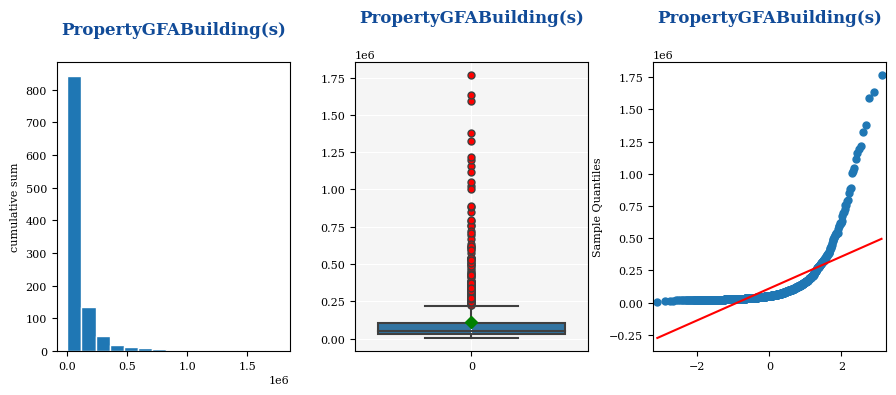

<Figure size 640x480 with 0 Axes>

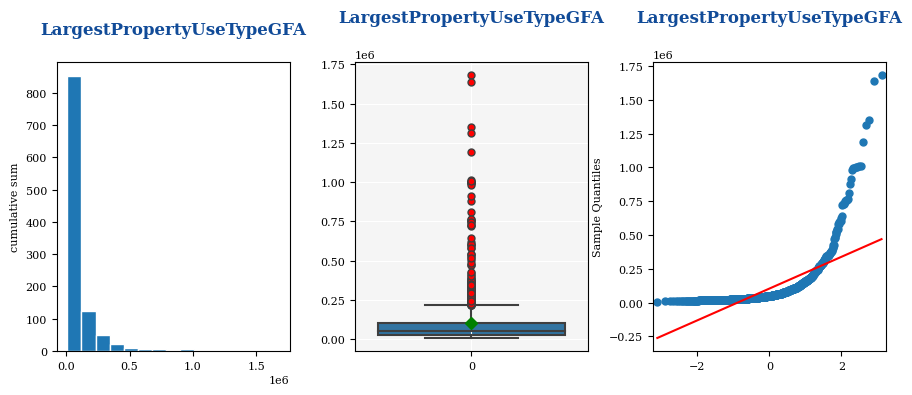

<Figure size 640x480 with 0 Axes>

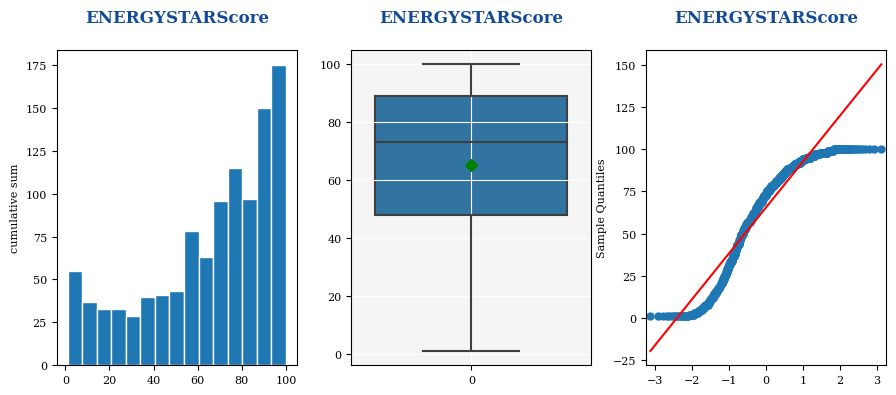

<Figure size 640x480 with 0 Axes>

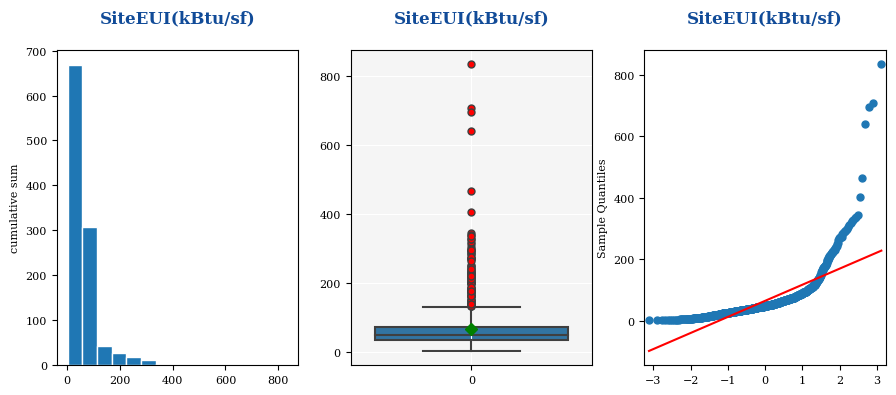

<Figure size 640x480 with 0 Axes>

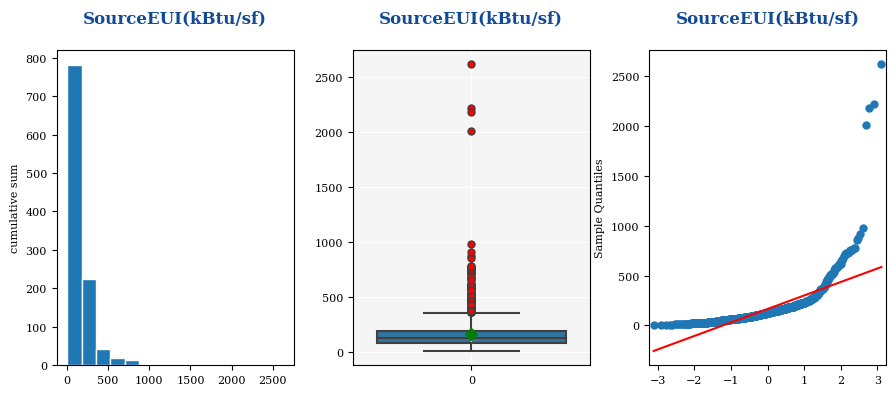

<Figure size 640x480 with 0 Axes>

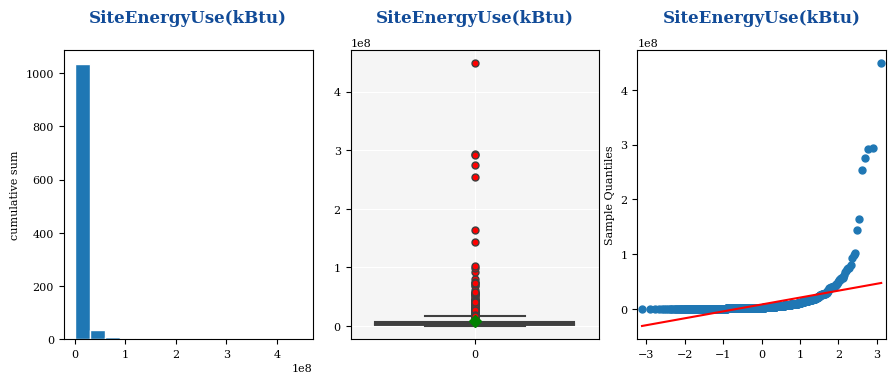

<Figure size 640x480 with 0 Axes>

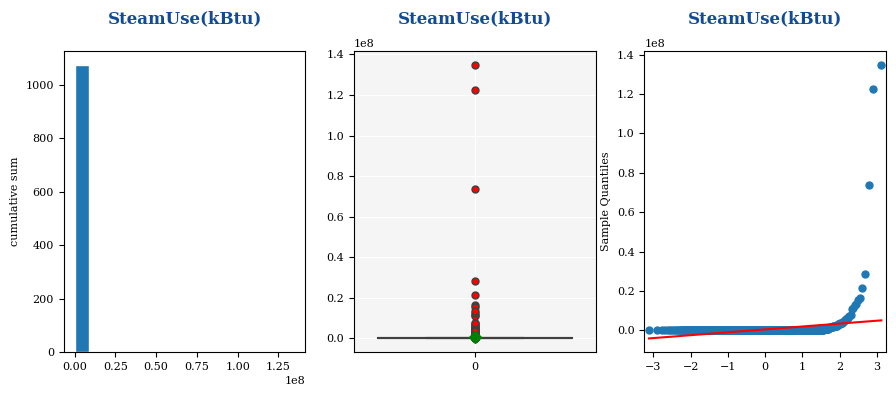

<Figure size 640x480 with 0 Axes>

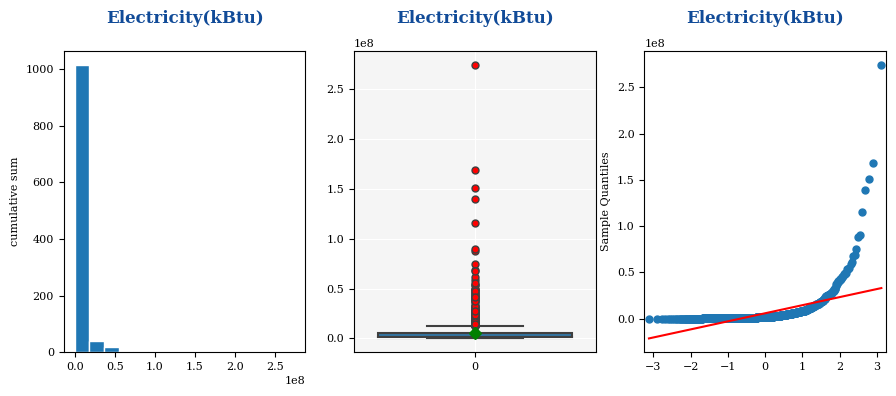

<Figure size 640x480 with 0 Axes>

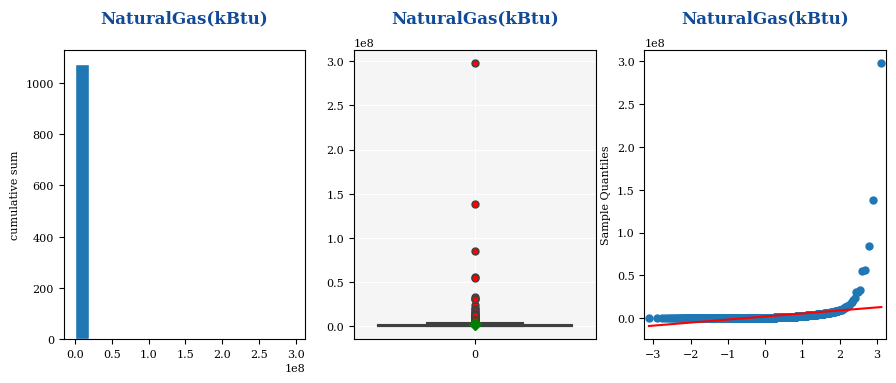

<Figure size 640x480 with 0 Axes>

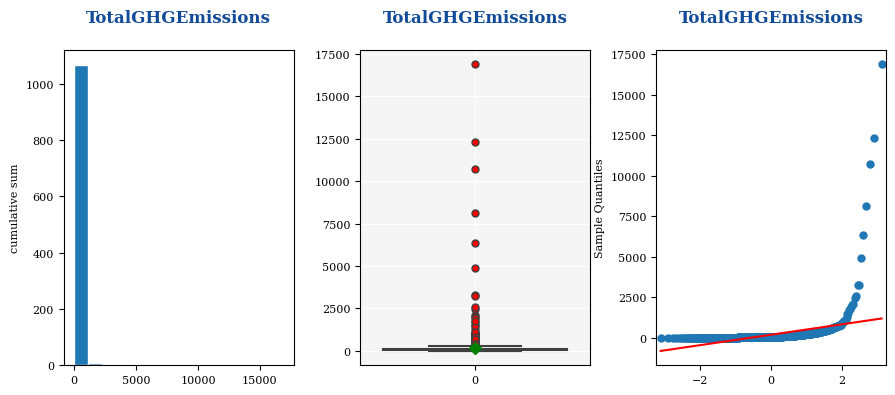

<Figure size 640x480 with 0 Axes>

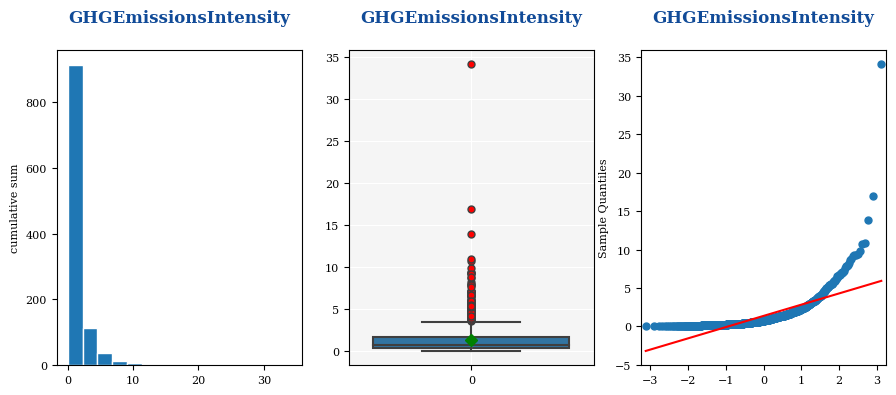

<Figure size 640x480 with 0 Axes>

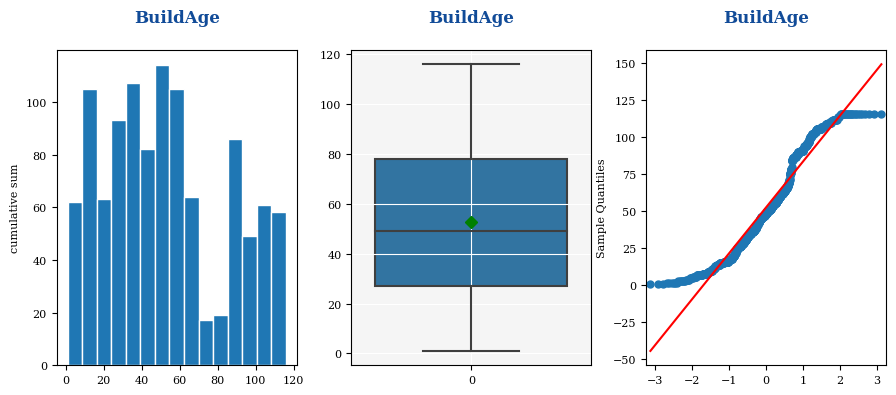

In [67]:
for var in numeric_features:
    AnalyseVarGraph(dfBuild, var) # , grahName='normalvars.png' 

#### <font color='#337da4' font-size='90%' text-align='left'> Test de normalité des variables numériques </font>

----------

In [68]:
for var in numeric_features:
    test_AndersonDarling(dfBuild, var,seuil=1)

Distribution normale CouncilDistrictCode : False
Distribution normale Latitude : False
Distribution normale Longitude : False
Distribution normale YearBuilt : False
Distribution normale NumberofBuildings : False
Distribution normale NumberofFloors : False
Distribution normale PropertyGFATotal : False
Distribution normale PropertyGFAParking : False
Distribution normale PropertyGFABuilding(s) : False
Distribution normale LargestPropertyUseTypeGFA : False
Distribution normale ENERGYSTARScore : False
Distribution normale SiteEUI(kBtu/sf) : False
Distribution normale SourceEUI(kBtu/sf) : False
Distribution normale SiteEnergyUse(kBtu) : False
Distribution normale SteamUse(kBtu) : False
Distribution normale Electricity(kBtu) : False
Distribution normale NaturalGas(kBtu) : False
Distribution normale TotalGHGEmissions : False
Distribution normale GHGEmissionsIntensity : False
Distribution normale BuildAge : False



#### <font color='#337da4' font-size='90%' text-align='left'> Analyse variables catégorielles </font>

----------

In [69]:
quali_features=selectionVar(dfBuild, typevar=[np.object])
# print(quali_features)

def Camembert(data,col,figsize=(6,3)):
    df = data[col].value_counts().reset_index()
    L=len(df[col])
    labels=list(df['index'])
    sizes=list(df[col])
    # print(labels,"\n",sizes)
    explode = Explodetuple(L)
    colors =AllColors[:L]
    # plt.figure(figsize=figsize)
    fig1, ax1 = plt.subplots(figsize=figsize)
    ax1.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',shadow=True, startangle=0) 
    # Equal aspect ratio ensures that pie is drawn as a circle
    ax1.axis('equal')
    plt.tight_layout()
    plt.show()
    
# category_features=['BuildingType',  'ComplianceStatus','BuildAgeGroup']
# for var in category_features:
#     Camembert(dfBuild,var)
#     # display(dfBuild[var].value_counts())

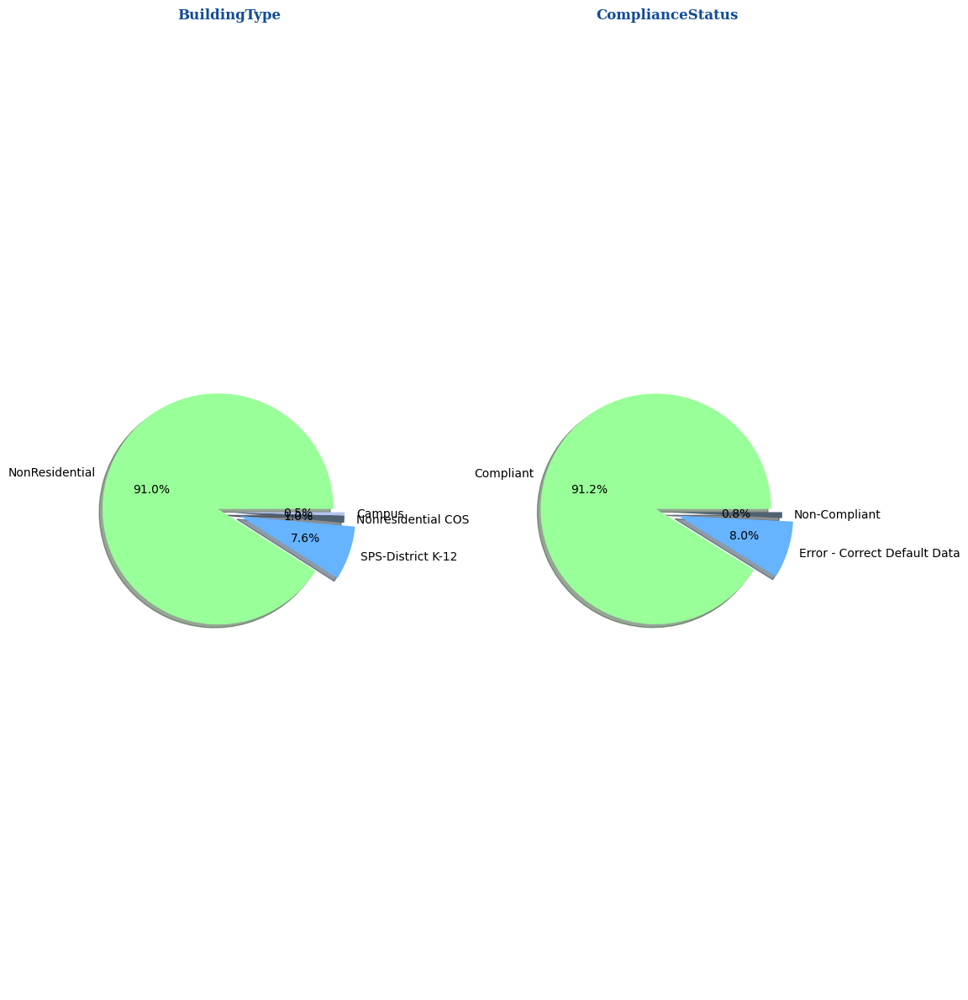

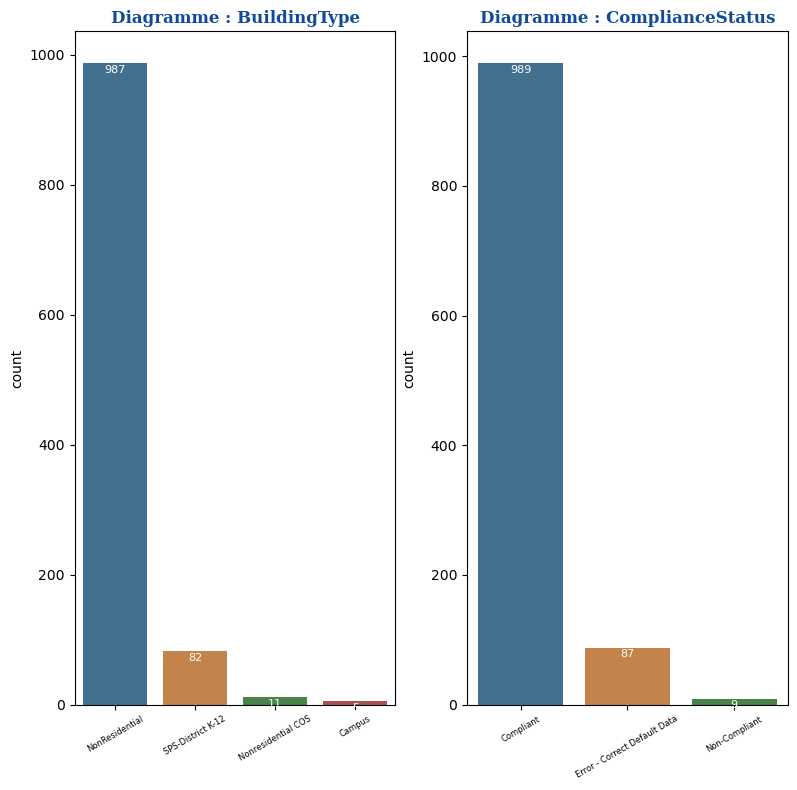

In [70]:
def trim_axs(axs, N):
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]


def CamembertMulticols(data,indicatorList,graphName=''):
    nplot =  len(indicatorList)
    figsize = (15, 12)
    cols = 3
    rows =  nplot// cols + 1

    axs = plt.figure(figsize=figsize, constrained_layout=True).subplots(rows, cols)
    axs = trim_axs(axs, nplot)
    for ax, ind in zip(axs, indicatorList):
        df = data[ind].value_counts().reset_index()
        L=len(df[ind])
        labels=list(df['index'])
        sizes=list(df[ind])
        explode = Explodetuple(L)
        colors =AllColors[:L]
        m=ax.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',shadow=True, startangle=0) 
        ax.axis('equal')
        ax.set_title(ind,fontdict=font_title2)
    plt.tight_layout(w_pad=0.5, h_pad=0.65)
    if graphName!='':
        plt.savefig(imgPath+graphName, bbox_inches='tight', dpi=400)
    plt.show()



def HistoMulticols(data,indicatorList,cols = 3, graphName='', figsize = (12, 8)):    
    nplot =  len(indicatorList)        
    rows =  nplot// cols + 1
    axs = plt.figure(figsize=figsize, constrained_layout=True).subplots(rows, cols)
    axs = trim_axs(axs, nplot)
    for ax, ind in zip(axs, indicatorList):
        df = data[ind].value_counts()
        sns.countplot(data=data[[ind]], x=ind,linewidth=1,saturation=0.5,order=df.index, ax=ax) 
        # ax.axis('equal')
        ax.set_xticklabels(df.index,rotation=30, fontsize=6)
        ax.set_xlabel('')
        ax.set_title('Diagramme : '+ind,fontdict=font_title2)
        for x, y in enumerate(data[ind].value_counts(ascending=False)): 
            ax.annotate(str(np.around(y,decimals=1)), xy=(x, y-2), va='top',ha='center',color='white', 
                         fontsize=8)
        if graphName!='':
            graphName1='Uni'+ind+'.png'
            ax.savefig(imgPath+graphName1, bbox_inches='tight')
            
    plt.tight_layout(w_pad=0.5, h_pad=0.65)
    plt.show()

def histogramPlot(data,ind,figsize=(20,10),grahName=''):
    df = data[ind].value_counts(ascending=False)
    plt.figure(figsize=figsize,constrained_layout=True)
    sns.countplot(data=data[[ind]], x=ind,linewidth=1,saturation=0.5,order=df.index) 
    # ax.axis('equal')
    plt.xticks(rotation=90, fontsize=6)
    # plt.xticks(rotation = 45) 
    plt.title(ind,fontdict=font_title2)
    for x, y in enumerate(data[ind].value_counts()): 
        plt.annotate(str(np.around(y,decimals=1)), xy=(x, y-20), va='top',ha='center',color='white', 
                 fontsize=10)
    plt.tight_layout(w_pad=0.5, h_pad=0.65) # w_pad=0.5, h_pad=0.65
    plt.show()
    if grahName!='':
        plt.savefig(imgPath+grahName, dpi=400)

def histogramPlot2(data,ind,figsize=(20,10),grahName=''):
    df = data[ind].value_counts(ascending=False)
    plt.figure(figsize=(20,10))
    ax=sns.countplot(x = data[ind],order=df.index)
    plt.title("Représentation de la variable {}" .format(ind), fontsize = 24)
    for x, y in enumerate(data[ind].value_counts()): 
        plt.annotate(str(np.around(y,decimals=1)), xy=(x, y-5), va='center',ha='right',color='white', 
                 fontsize=10)
    # plt.rc('xtick', labelsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right")
    plt.tight_layout()
    plt.show()
    if grahName!='':
        plt.savefig(imgPath+grahName, dpi=400)

CamembertMulticols(dfBuild,category_features)
HistoMulticols(dfBuild,category_features) # ,grahName='UnivarCategory.png'
 # 
# for ind in ['PrimaryPropertyType', 'LargestPropertyUseType', 'Neighborhood']:
#     histogramPlot2(dfBuild,ind,figsize=(10, 10),grahName='Uni'+ind+'.png')

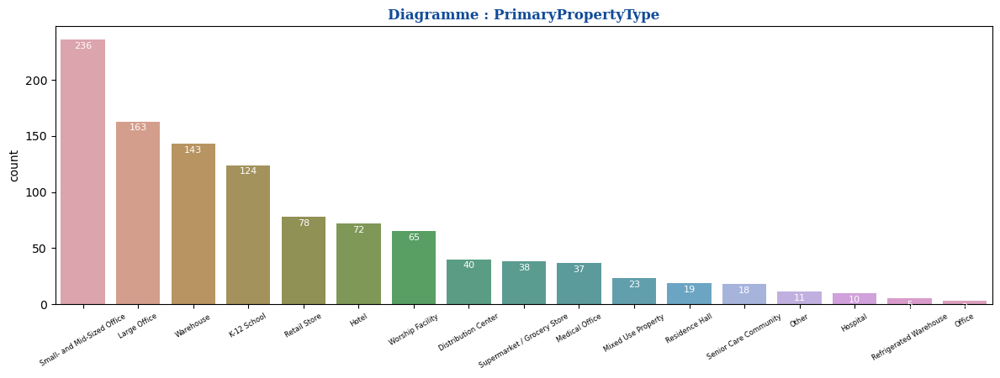

In [71]:
HistoMulticols(dfBuild,['PrimaryPropertyType'],cols = 1)

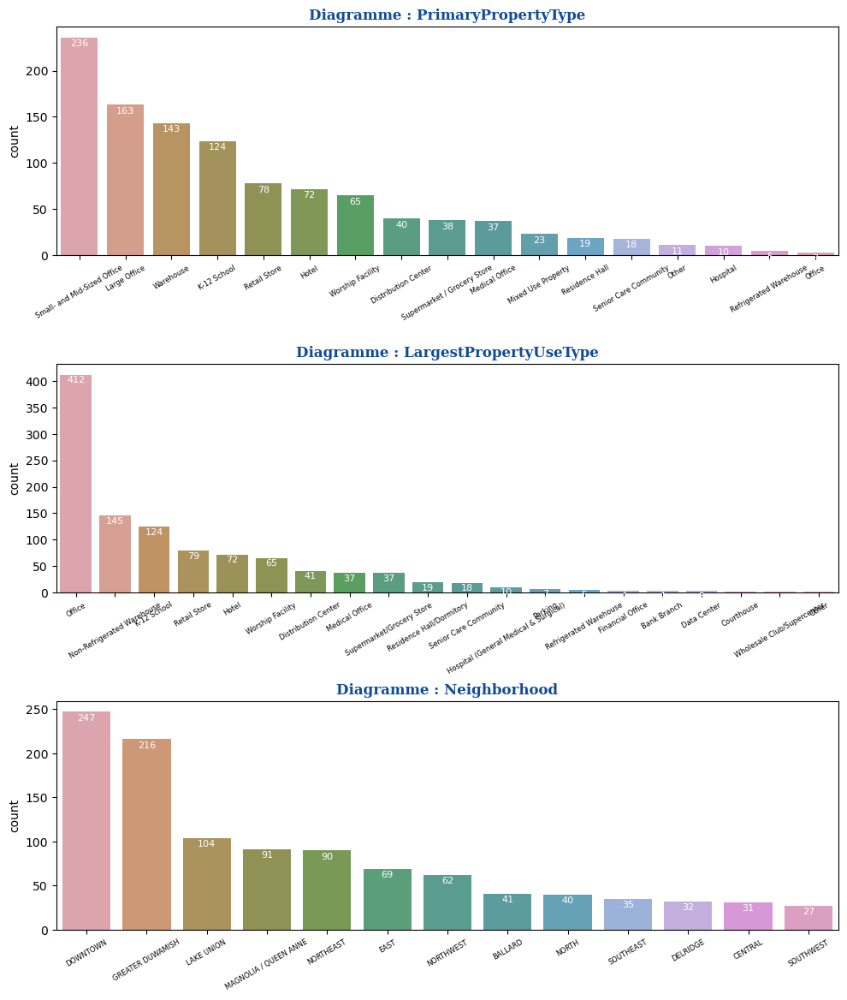

In [72]:
HistoMulticols(dfBuild,['PrimaryPropertyType', 'LargestPropertyUseType', 'Neighborhood'],cols = 1,figsize = (10, 15))

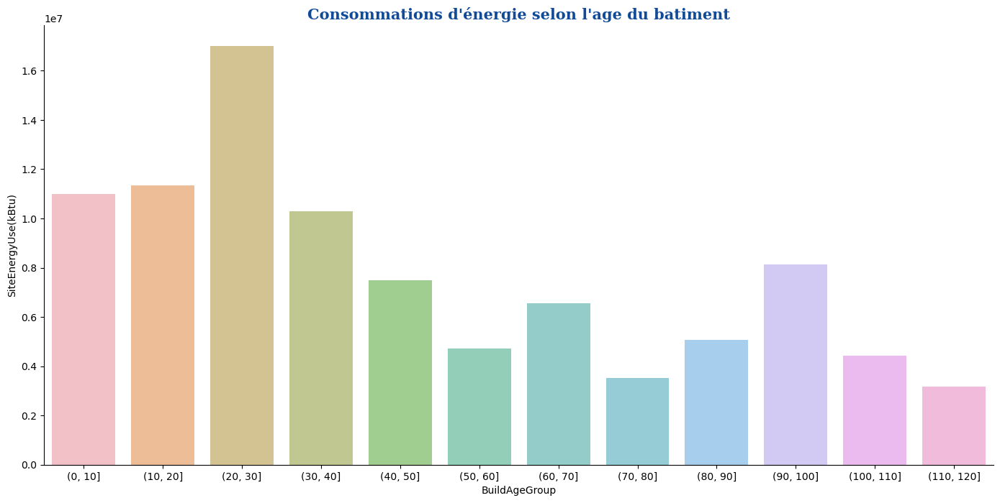

In [73]:
sns.catplot(data=dfBuild, kind="bar", x='BuildAgeGroup', y="SiteEnergyUse(kBtu)",
            ci=None,  alpha=.6, height=7, aspect=2)

plt.title("Consommations d'énergie selon l'age du batiment", fontdict=font_title)
plt.show()

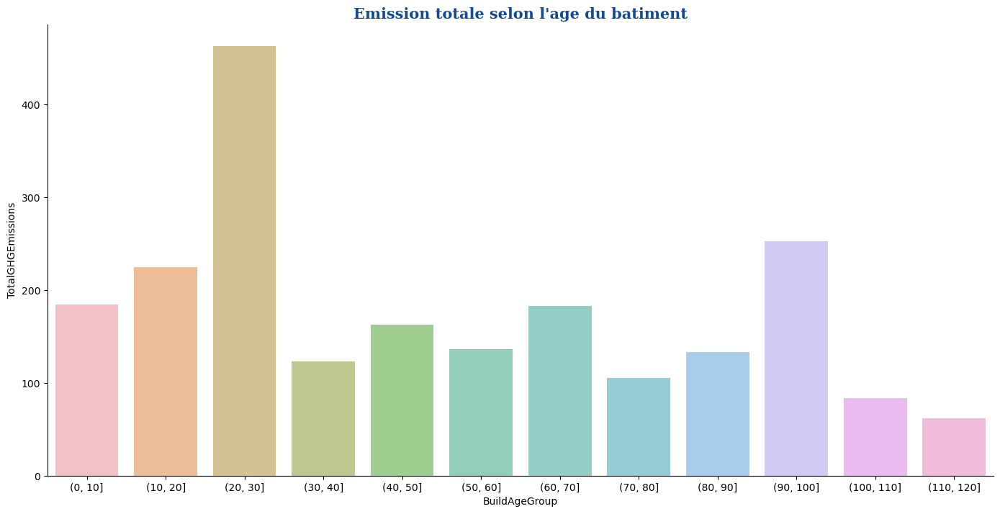

In [74]:
sns.catplot(data=dfBuild, kind="bar", x='BuildAgeGroup', y="TotalGHGEmissions",
            ci=None,  alpha=.6, height=7, aspect=2)

plt.title("Emission totale selon l'age du batiment", fontdict=font_title)
plt.show()

                   TotalGHGEmissions  BuildAge
TotalGHGEmissions           1.000000 -0.152056
BuildAge                   -0.152056  1.000000


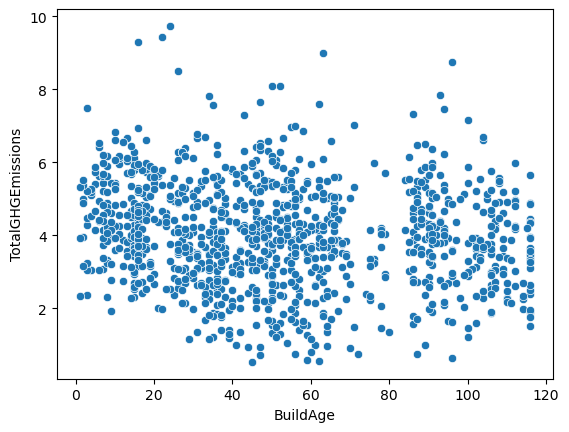

In [75]:
sns.scatterplot(data=dfBuild, x='BuildAge', y=np.log(dfBuild["TotalGHGEmissions"]+1))
print(dfBuild[['TotalGHGEmissions','BuildAge']].corr(method='spearman'))

<AxesSubplot: xlabel='BuildAge', ylabel='SiteEnergyUse(kBtu)'>

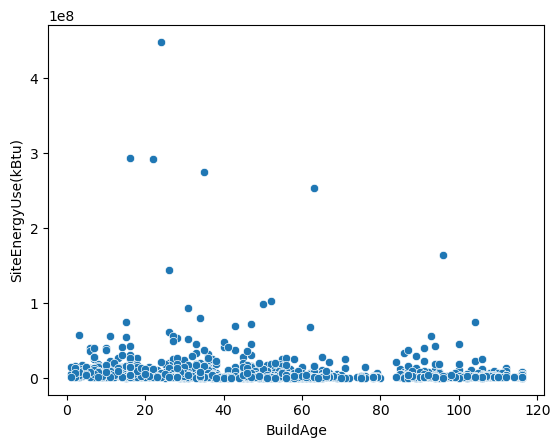

In [76]:
sns.scatterplot(data=dfBuild, x='BuildAge', y="SiteEnergyUse(kBtu)")

--------
Les batiments de moins de 30 ans ont des consommations d'énergie et d'émissions de CO2 plus importantes que les ceux plus anciens.


#### <font color='#337da4' font-size='90%' text-align='left'> Analyse variables qualitatives </font>

----------

------------------------------------

#### Nuage de mots sur : Neighborhood

------------------------------------

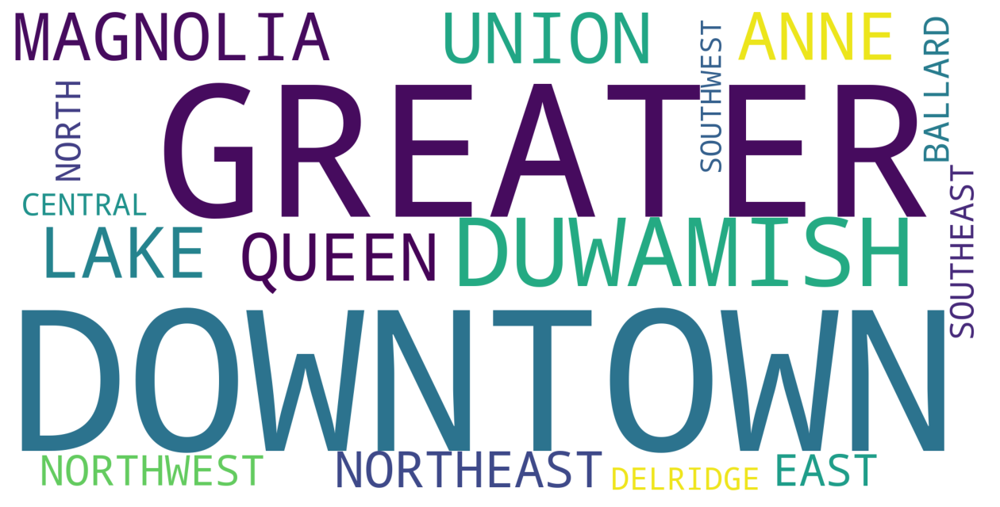

------------------------------------

#### Nuage de mots sur : PropertyName

------------------------------------

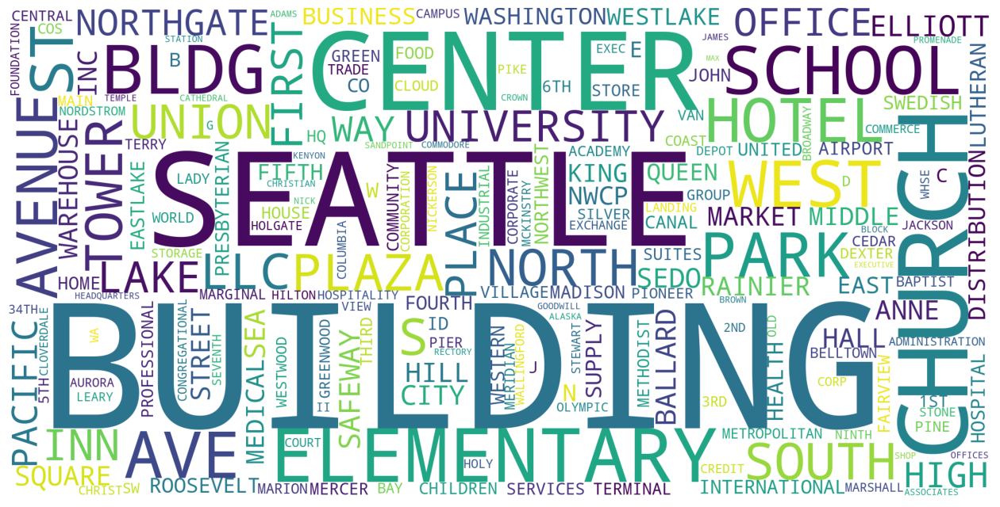

------------------------------------

#### Nuage de mots sur : LargestPropertyUseType

------------------------------------

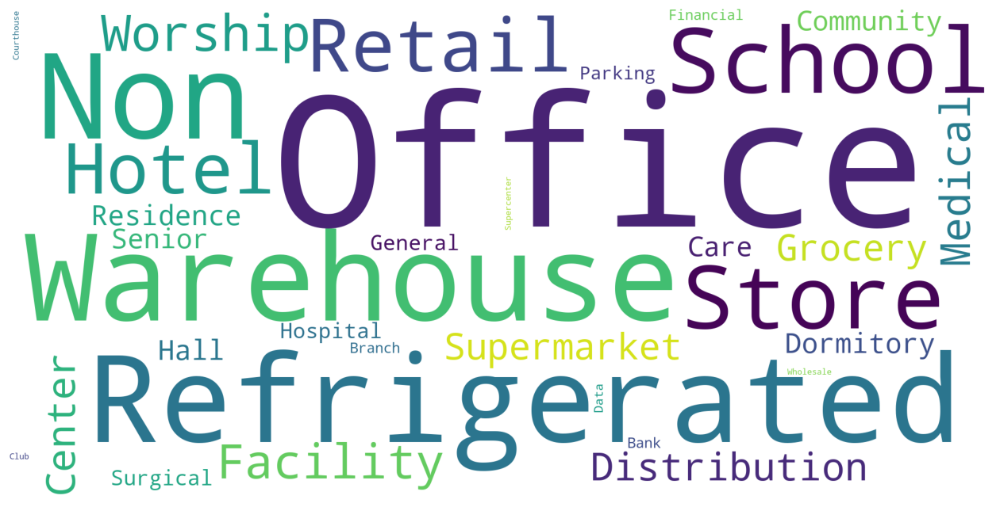

------------------------------------

#### Nuage de mots sur : ListOfAllPropertyUseTypes

------------------------------------

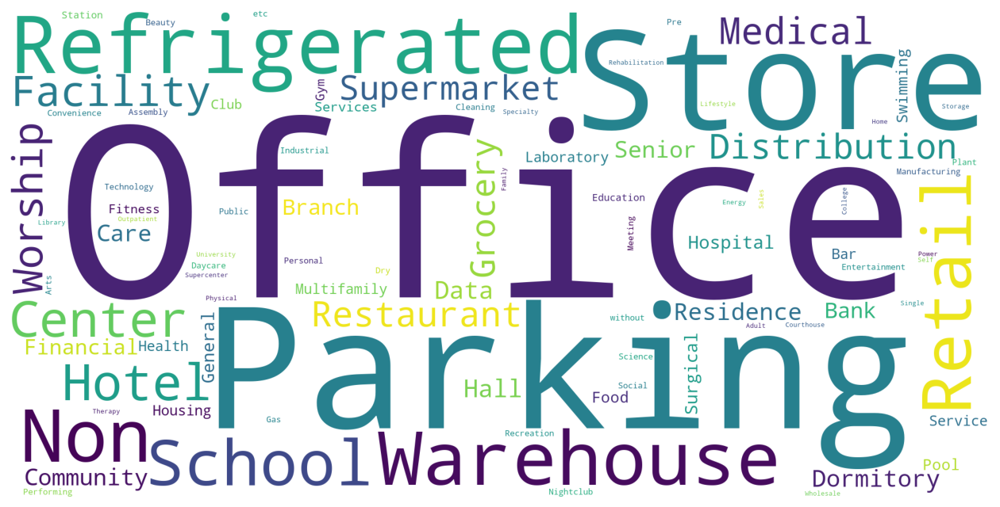

------------------------------------

#### Nuage de mots sur : Address

------------------------------------

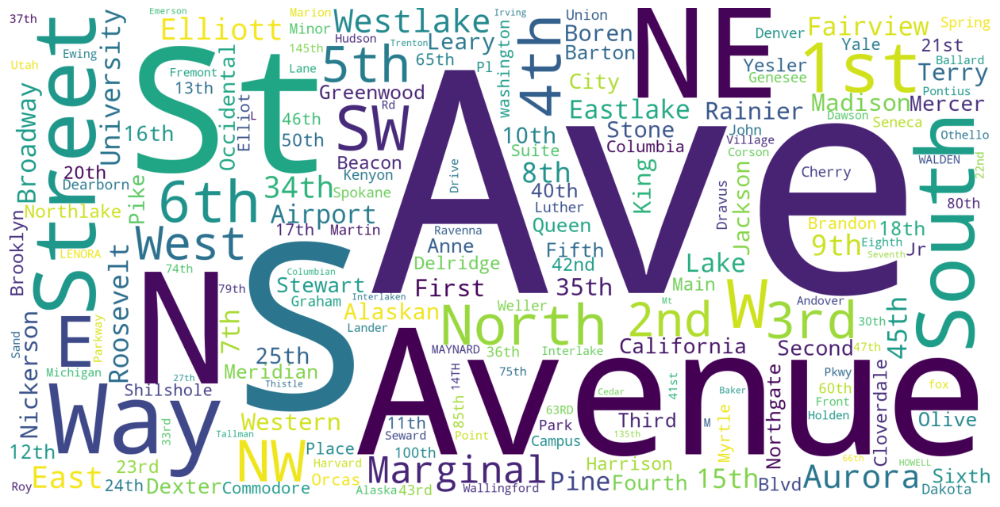

------------------------------------

#### Nuage de mots sur : PrimaryPropertyType

------------------------------------

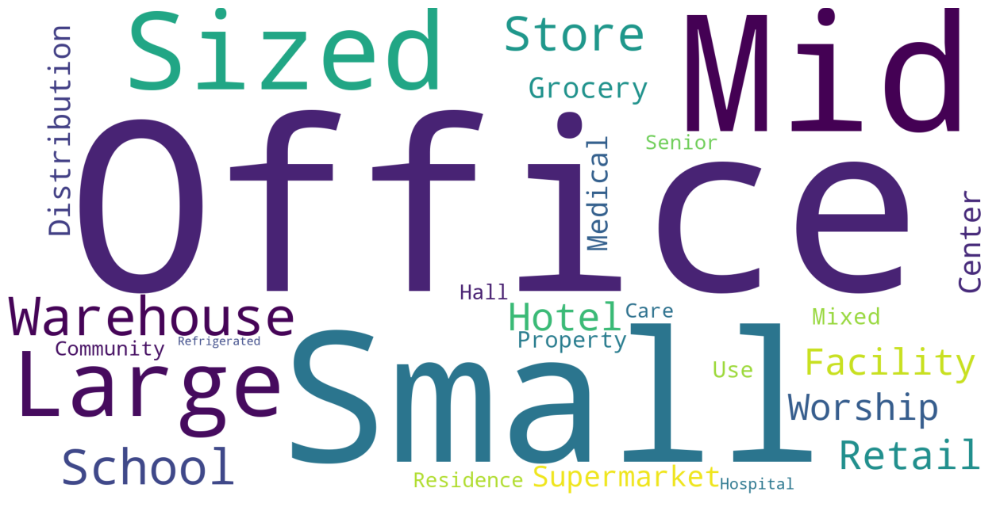

In [77]:
for col in list(set(quali_features)-set(['BuildingType','ComplianceStatus'])):
    nuageMots(dfBuild, col,figsize=(16,12),color="white",graphName='')

### <font color='#337da4' font-size='90%' text-align='left'> 4.2. Analyse bivariée <a id="4.2"></a></font>


#### <font color='#337da4' font-size='90%' text-align='left'> Lien entre variables quantitatives (correlation) </font>

----------


Les distributions n'étant pas normales, nous allons utiliser un test de correlation de Spearman.



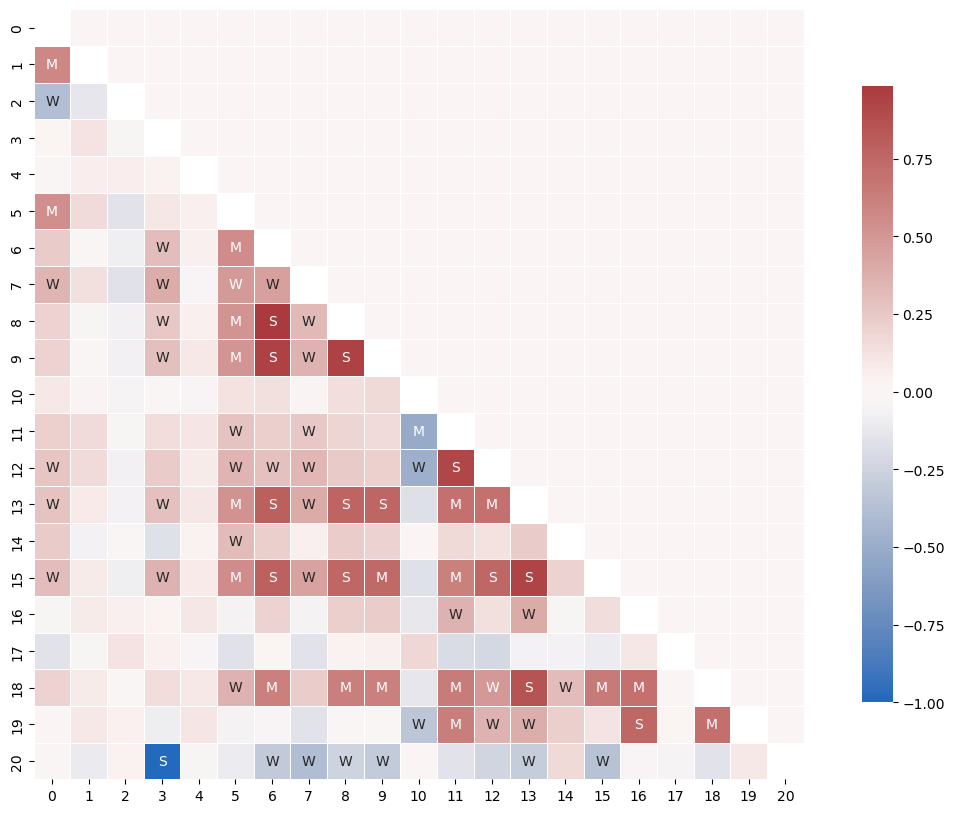

In [78]:
# Computes feature correlation
df_corr =np.tril(dfBuild.corr(method='spearman',numeric_only=True))

# Create labels for the correlation matrix
labels = np.where(np.abs(df_corr)>0.75, "S",
                  np.where(np.abs(df_corr)>0.5, "M",
                           np.where(np.abs(df_corr)>0.25, "W", "")))

# Plot correlation matrix
plt.figure(figsize=(15, 10))
sns.heatmap(df_corr, mask=np.eye(len(df_corr)), square=True,
            center=0, annot=labels, fmt='', linewidths=.5,
            cmap="vlag", cbar_kws={"shrink": 0.8});

In [79]:
def matriceCorrelation(data,graphName='correlation.png',figsize=(15, 15)):
    upp_mat = np.triu(data.corr(method='spearman',numeric_only=True))
    plt.figure(figsize=figsize) 
    ax = sns.heatmap(data.corr(method='spearman',numeric_only=True), annot=True, fmt=".2f",
                     cmap='coolwarm', annot_kws = {'size' : 6}, linewidth = 1, mask = upp_mat) # cmap = 'coolwarm',cmap = 'Wistia'
    plt.xticks(rotation=35, fontsize=6)
    plt.yticks(rotation=0, fontsize=6)
    plt.title("Coefficients de corrélation de Spearman", fontdict=font_title)
    plt.savefig(imgPath+graphName, bbox_inches='tight',dpi=400)
    plt.show()

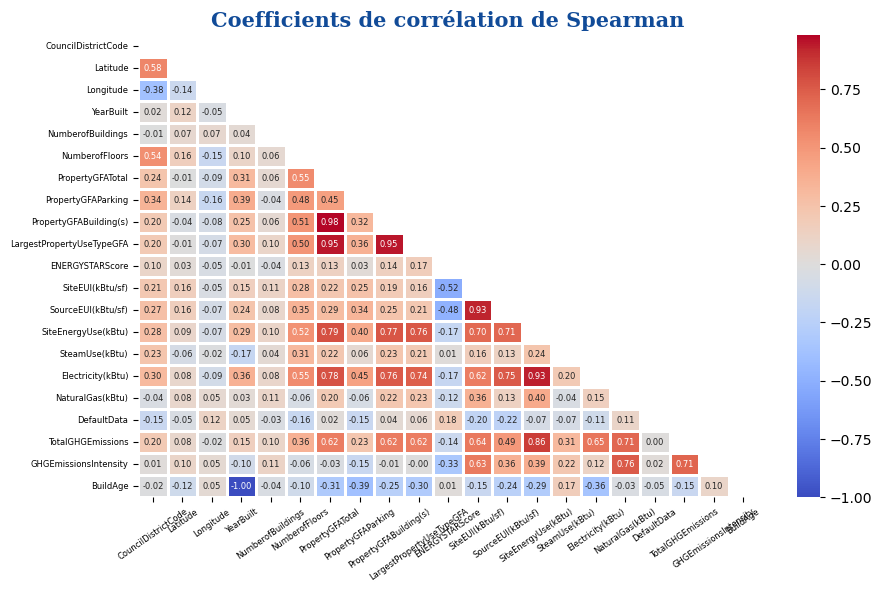

In [80]:
matriceCorrelation(dfBuild,graphName='correlation.png',figsize=(10, 6))
# corr = dfBuild.corr()
# sns.heatmap(corr, cmap = 'Wistia', annot= True);

------------
L'analyse de la matrice de corrélation montre que la variable d'interêt **SiteEnergyUse(kBtu)** est correlée avec les variables  ``PropertyGFATotal, PropertyGFABuilding(s), LargestPropertyUseTypeGFA, SiteEUI(kBtu/sf), SourceEUI(kBtu/sf), Electricity(kBtu)``.   

Quant à la variable d'interêt **TotalGHEmissions**, elle est correlée avec `PropertyGFATotal, PropertyGFABuilding(s), LargestPropertyUseTypeGFA, SiteEUI(kBtu/sf), SourceEUI(kBtu/sf), NaturalGas(kBtu), Electricity(kBtu)`.
    
------------

In [81]:
# Variables Correlées avec nos targets
targets=['TotalGHGEmissions','SiteEnergyUse(kBtu)']

def correlatedToTarget(data, target, threshold):
    corr_matrix =data.corr(method='spearman',numeric_only=True)
    corr_target = abs(corr_matrix[target])
    # Selection des variables corrélées avec la target
    relevant_features = corr_target[corr_target>=threshold]
    return relevant_features # , pd.DataFrame(relevant_features).index.unique().tolist()


In [82]:
correlatedToTarget(dfBuild, 'TotalGHGEmissions', 0.5) # 'SiteEnergyUse(kBtu)'

PropertyGFATotal             0.618681
PropertyGFABuilding(s)       0.624069
LargestPropertyUseTypeGFA    0.618268
SiteEUI(kBtu/sf)             0.639629
SiteEnergyUse(kBtu)          0.859128
Electricity(kBtu)            0.646560
NaturalGas(kBtu)             0.711632
TotalGHGEmissions            1.000000
GHGEmissionsIntensity        0.713213
Name: TotalGHGEmissions, dtype: float64

In [83]:
correlatedToTarget(dfBuild, 'SiteEnergyUse(kBtu)', 0.5)

NumberofFloors               0.524795
PropertyGFATotal             0.791271
PropertyGFABuilding(s)       0.773588
LargestPropertyUseTypeGFA    0.763828
SiteEUI(kBtu/sf)             0.697925
SourceEUI(kBtu/sf)           0.707724
SiteEnergyUse(kBtu)          1.000000
Electricity(kBtu)            0.931671
TotalGHGEmissions            0.859128
Name: SiteEnergyUse(kBtu), dtype: float64

In [84]:
features_retenus_CO2=list(set(correlatedToTarget(dfBuild, 'TotalGHGEmissions', 0.5).index.unique().tolist())
                      -set(targets))
features_retenus_CO2

['GHGEmissionsIntensity',
 'PropertyGFATotal',
 'Electricity(kBtu)',
 'NaturalGas(kBtu)',
 'SiteEUI(kBtu/sf)',
 'LargestPropertyUseTypeGFA',
 'PropertyGFABuilding(s)']

In [85]:
features_retenus_Energy=list(set(correlatedToTarget(dfBuild, 'SiteEnergyUse(kBtu)', 0.5).index.unique().tolist())
                      -set(targets))
features_retenus_Energy

['LargestPropertyUseTypeGFA',
 'Electricity(kBtu)',
 'PropertyGFABuilding(s)',
 'PropertyGFATotal',
 'SiteEUI(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'NumberofFloors']

-----
Nous avons des corrélations linéaires fortes entre variables. Ces corrélations peuvent entrainer des problèmes de colinéarité dans nos modèles de regression. De ce fait, nous allons identifier les pairs de variables avec des corrélations  supérieurs à **0.7**.

In [86]:
def strongCorr(data, threshold = 0.7):
    corr = data.corr(method='spearman',numeric_only=True)
    corrPairs = corr.unstack().sort_values(kind="quicksort")
    high_corr = (pd.DataFrame(corrPairs[(abs(corrPairs) > threshold)])
                   .reset_index().rename(columns={0:'corr_coeff'}))
    high_corr = high_corr[(high_corr.index%2 == 0) & (high_corr['level_0'] != high_corr['level_1'])]
    high_corr.sort_values('corr_coeff', ascending=False,inplace=True)
    return high_corr

strongCorr(dfBuild[features_retenus_CO2], threshold = 0.7)

,level_0,level_1,corr_coeff
12,PropertyGFATotal,PropertyGFABuilding(s),0.983128
10,LargestPropertyUseTypeGFA,PropertyGFABuilding(s),0.950134
8,LargestPropertyUseTypeGFA,PropertyGFATotal,0.948520
6,Electricity(kBtu),PropertyGFATotal,0.784482
4,NaturalGas(kBtu),GHGEmissionsIntensity,0.757432
2,Electricity(kBtu),PropertyGFABuilding(s),0.755685
0,LargestPropertyUseTypeGFA,Electricity(kBtu),0.738973


In [87]:
strongCorr(dfBuild[list(set(features_retenus_CO2)-set(['Electricity(kBtu)','PropertyGFABuilding(s)']))], threshold = 0.7)

,level_0,level_1,corr_coeff
2,LargestPropertyUseTypeGFA,PropertyGFATotal,0.948520
0,NaturalGas(kBtu),GHGEmissionsIntensity,0.757432


In [88]:
strongCorr(dfBuild[features_retenus_Energy], threshold = 0.7)

,level_0,level_1,corr_coeff
14,PropertyGFABuilding(s),PropertyGFATotal,0.983128
12,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,0.950134
10,PropertyGFATotal,LargestPropertyUseTypeGFA,0.948520
8,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),0.925810
6,Electricity(kBtu),PropertyGFATotal,0.784482
4,Electricity(kBtu),PropertyGFABuilding(s),0.755685
2,SourceEUI(kBtu/sf),Electricity(kBtu),0.751378
0,Electricity(kBtu),LargestPropertyUseTypeGFA,0.738973


In [89]:
strongCorr(dfBuild[list(set(features_retenus_Energy)-set(['Electricity(kBtu)','PropertyGFABuilding(s)']))], threshold = 0.7)

,level_0,level_1,corr_coeff
2,PropertyGFATotal,LargestPropertyUseTypeGFA,0.94852
0,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),0.92581


------
Vérification de **multicolinéarité avec le VIF** *(Variance Inflation Factor)* : $VIF = \frac{1}{1-R^2}$    
Des scores **VIF supérieur à 5** indiquent généralement une forte multicolinéarité. Ces variables fortement corrélées risquent d'impacter nos modèles et seront supprimées. 

In [90]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def verifVIF(data,threshold = 0.7):
    high_corr=strongCorr(data, threshold =threshold)
    high_corr_features = list(set(list(high_corr['level_0'].values) + list(high_corr['level_1'].values)))
    X = data[high_corr_features].replace([np.inf, -np.inf], np.nan)
    X = X.dropna()
    tab_VIF = pd.DataFrame()
    tab_VIF["feature"] = X.columns
    tab_VIF["VIF"] = [variance_inflation_factor(X.values, i) 
                       for i in range(len(X.columns))]
    tab_VIF.sort_values(by=["VIF"],ascending=False, inplace=True)
    # tab_VIF[tab_VIF['VIF'] > 5]
    return tab_VIF
    
verifVIF(dfBuild[features_retenus_Energy],threshold =0.7)

,feature,VIF
5,PropertyGFABuilding(s),42.202697
2,PropertyGFATotal,40.426381
4,SourceEUI(kBtu/sf),25.346656
3,SiteEUI(kBtu/sf),24.310286
0,LargestPropertyUseTypeGFA,19.855527
1,Electricity(kBtu),3.034941


In [91]:
verifVIF(dfBuild[features_retenus_CO2],threshold = 0.7)

,feature,VIF
5,PropertyGFABuilding(s),41.639382
2,PropertyGFATotal,40.038524
4,LargestPropertyUseTypeGFA,20.307049
1,Electricity(kBtu),2.729060
0,GHGEmissionsIntensity,1.800443
3,NaturalGas(kBtu),1.715209


In [92]:
def collinear_features(x,features_retenus, threshold):
    # matrice de correlation
    # corr_matrix = x.corr(method='spearman',numeric_only=True).drop(columns=set(targets))
    matrix=x.corr(method='spearman',numeric_only=True)
    corr_matrix = matrix.loc[matrix.index.isin(features_retenus),features_retenus]
    corr_matrix
    display(corr_matrix)
    collinearFeatures={}
    res={}
    temp=[]
    c=0
    # Iterate through the correlation matrix and compare correlations
    for cols in corr_matrix.columns:
        correlatedColumns = []
        # correlatedColumns.append(cols)
        
        for rows in list(set(corr_matrix.columns)): # -set([cols]
            val = abs(corr_matrix.loc[corr_matrix.index.isin([rows]), cols]).values[0]
            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
                # print(cols, "|", rows, "|", round(val, 2))
                correlatedColumns.append(rows)
            else :
                pass
        # print(correlatedColumns)
        
        if len(correlatedColumns)>=2:
            res[c]=list(set(correlatedColumns))
            c+=1
        else :
            pass
    

    for key,val in res.items():
        if val not in temp:
            temp.append(val)
            collinearFeatures[key]=val
        
    # # Drop one of each pair of correlated columns
    # drops = set(correlatedColumns)
    # x = x.drop(columns=drops)

    return collinearFeatures

---
<h4> Bilan de l'analyse des correlations </h4>
Nous avons de fortes correlations entre plusieurs variables. 

- Donc, nous allons garder la variable **PropertyGFATotal**, comme explicative pour la **consommation d'énergie**.   
- Donc, nous allons garder la variable **PropertyGFATotal, NaturalGas(kBtu)**, comme explicatives pour **l'émission de CO2**.    
- Les autres variables seront transformées au niveau du **feature engeneering**.


#### <font color='#337da4' font-size='90%' text-align='left'> Lien entre les variables d'interêt et quelques variables qualitatives </font>

----------

In [93]:
from IPython.display import display, Markdown
from matplotlib.lines import Line2D

from pingouin import kruskal
import scikit_posthocs as sp

def kruskallWallisTest(data,Nvar,Qvar):
    aov=kruskal(data=data, dv=Nvar, between=Qvar)
    display(aov)    
    aovPost=sp.posthoc_dunn(data,Nvar,Qvar, 'bonferroni').round(3).style.applymap(lambda x: 'background-color : gray' if x<0.05 else '')
    display(aovPost)


def realtionQantiQuali(data, Nvar,Qvar,figsize=(20,8)):
    display(Markdown('------------------------------------'))       
    display(Markdown('#### Liaison entre  : {0}  et {1}'.format(Nvar,Qvar)))
    display(Markdown('------------------------------------'))
    moyenne=data[Nvar].mean()
    fig=plt.figure(figsize=figsize)
    # fig.patch.set_facecolor('#E0E0E0')
    # fig.patch.set_alpha(0.7)
    plt.title(f"Distribution de {Nvar} par {Qvar}", fontdict=font_title)
    sns.boxplot(x=Qvar, y=Nvar, data=data,width=0.5,showfliers=False,showmeans=True) # ,color="#cbd1db",
    plt.hlines(y=moyenne,xmin=-0.5,xmax=len(data[Qvar].unique())-0.5,color="#6d788b",ls="--",label="Moyenne globale")

    plt.ylabel(Nvar,size=14)
    plt.xticks(range(0,len(data[Qvar].unique())),data[Qvar].unique(),rotation=90)
    plt.legend()
    plt.grid()
    plt.show()
    kruskallWallisTest(data,Nvar,Qvar)


------------------------------------

#### Liaison entre  : TotalGHGEmissions  et BuildingType

------------------------------------

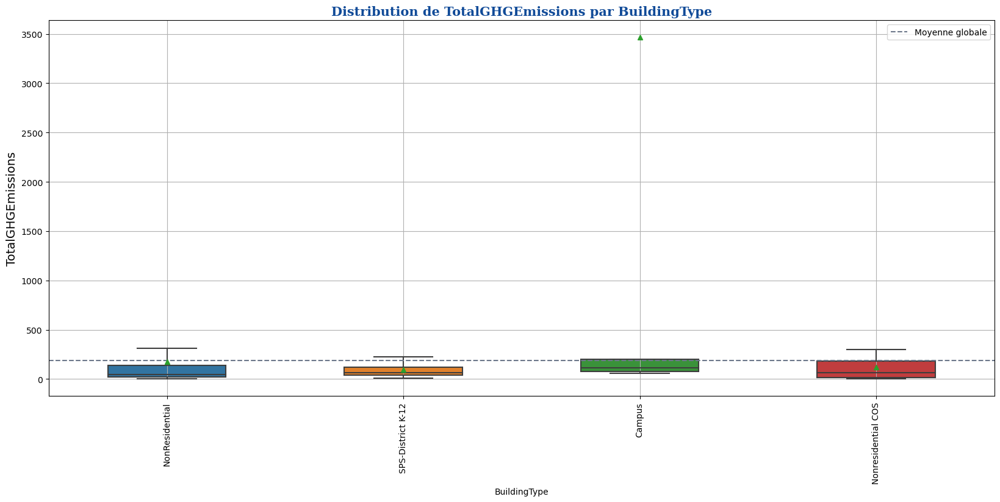

,Source,ddof1,H,p-unc
Kruskal,BuildingType,3,7.394914,0.060321


,Campus,NonResidential,Nonresidential COS,SPS-District K-12
Campus,1.000000,0.367000,0.809000,1.000000
NonResidential,0.367000,1.000000,1.000000,0.268000
Nonresidential COS,0.809000,1.000000,1.000000,1.000000
SPS-District K-12,1.000000,0.268000,1.000000,1.000000


------------------------------------

#### Liaison entre  : TotalGHGEmissions  et ComplianceStatus

------------------------------------

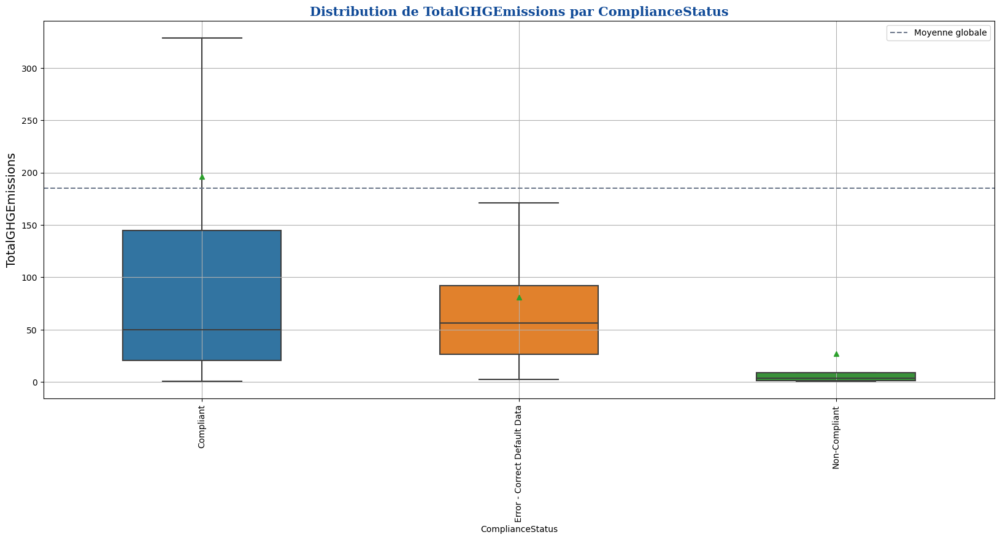

,Source,ddof1,H,p-unc
Kruskal,ComplianceStatus,2,13.084292,0.001441


,Compliant,Error - Correct Default Data,Non-Compliant
Compliant,1.000000,1.000000,0.001000
Error - Correct Default Data,1.000000,1.000000,0.002000
Non-Compliant,0.001000,0.002000,1.000000


------------------------------------

#### Liaison entre  : TotalGHGEmissions  et PrimaryPropertyType

------------------------------------

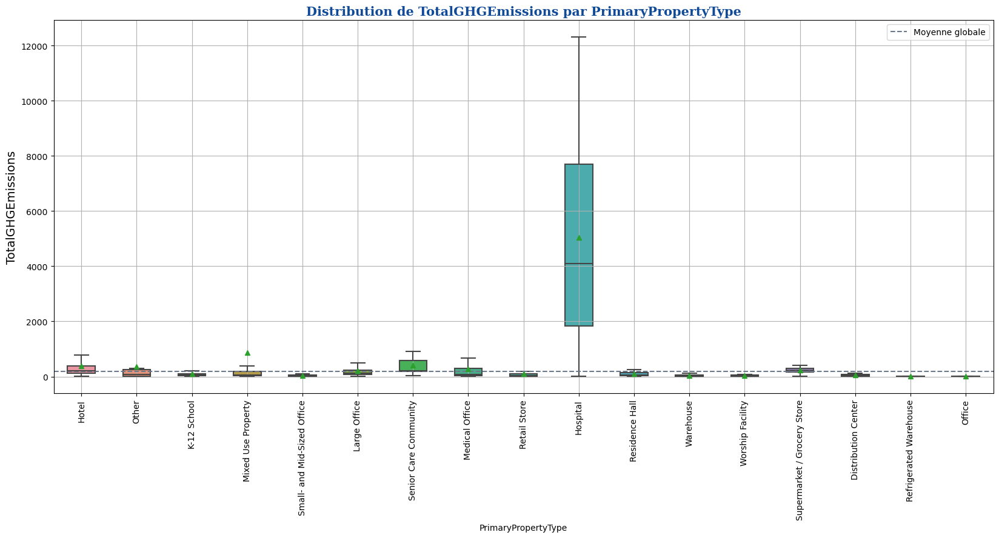

,Source,ddof1,H,p-unc
Kruskal,PrimaryPropertyType,16,414.800417,2.866182e-78


,Distribution Center,Hospital,Hotel,K-12 School,Large Office,Medical Office,Mixed Use Property,Office,Other,Refrigerated Warehouse,Residence Hall,Retail Store,Senior Care Community,Small- and Mid-Sized Office,Supermarket / Grocery Store,Warehouse,Worship Facility
Distribution Center,1.000000,0.000000,0.000000,0.028000,0.000000,0.061000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000
Hospital,0.000000,1.000000,1.000000,0.025000,1.000000,0.264000,0.056000,0.005000,0.536000,0.001000,0.187000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
Hotel,0.000000,1.000000,1.000000,0.000000,1.000000,0.261000,0.044000,0.021000,1.000000,0.003000,0.369000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
K-12 School,0.028000,0.025000,0.000000,1.000000,0.001000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.116000,0.000000,0.001000,0.000000,0.000000
Large Office,0.000000,1.000000,1.000000,0.001000,1.000000,1.000000,0.583000,0.079000,1.000000,0.019000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
Medical Office,0.061000,0.264000,0.261000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.731000,1.000000,1.000000,1.000000,0.000000,0.368000,0.000000,0.005000
Mixed Use Property,1.000000,0.056000,0.044000,1.000000,0.583000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.349000,0.323000,0.062000,0.167000,1.000000
Office,1.000000,0.005000,0.021000,1.000000,0.079000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.027000,1.000000,0.018000,1.000000,1.000000
Other,1.000000,0.536000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Refrigerated Warehouse,1.000000,0.001000,0.003000,1.000000,0.019000,0.731000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.007000,1.000000,0.003000,1.000000,1.000000


------------------------------------

#### Liaison entre  : TotalGHGEmissions  et Neighborhood

------------------------------------

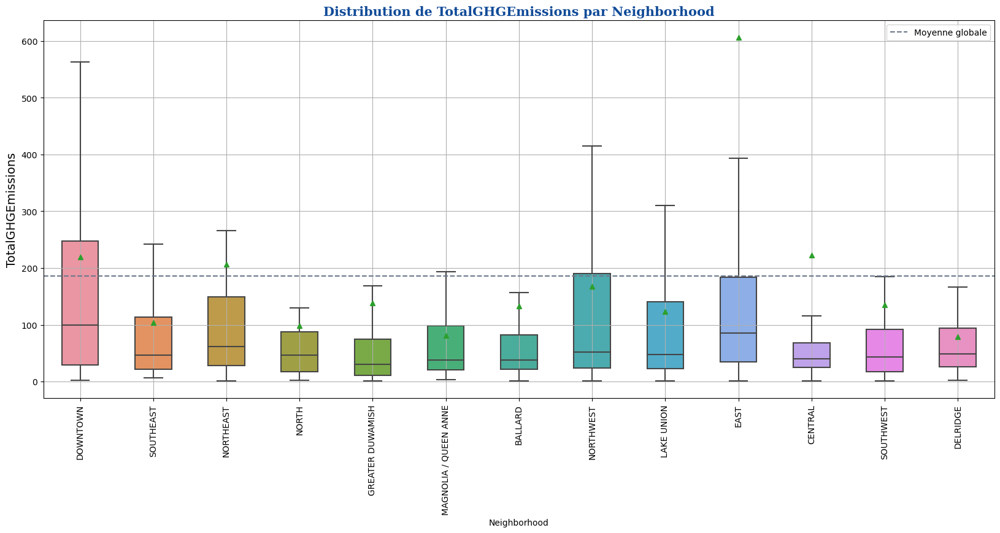

,Source,ddof1,H,p-unc
Kruskal,Neighborhood,12,78.928726,6.604034e-12


,BALLARD,CENTRAL,DELRIDGE,DOWNTOWN,EAST,GREATER DUWAMISH,LAKE UNION,MAGNOLIA / QUEEN ANNE,NORTH,NORTHEAST,NORTHWEST,SOUTHEAST,SOUTHWEST
BALLARD,1.000000,1.000000,1.000000,0.370000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CENTRAL,1.000000,1.000000,1.000000,0.475000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
DELRIDGE,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
DOWNTOWN,0.370000,0.475000,1.000000,1.000000,1.000000,0.000000,0.218000,0.001000,0.355000,1.000000,1.000000,1.000000,1.000000
EAST,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.156000,1.000000,1.000000,1.000000,1.000000,1.000000
GREATER DUWAMISH,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.056000,1.000000,1.000000,0.010000,0.077000,1.000000,1.000000
LAKE UNION,1.000000,1.000000,1.000000,0.218000,1.000000,0.056000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
MAGNOLIA / QUEEN ANNE,1.000000,1.000000,1.000000,0.001000,0.156000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
NORTH,1.000000,1.000000,1.000000,0.355000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
NORTHEAST,1.000000,1.000000,1.000000,1.000000,1.000000,0.010000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [94]:
for Qvar in category_features+['PrimaryPropertyType','Neighborhood']:
    realtionQantiQuali(dfBuild,'TotalGHGEmissions',Qvar)

------------------------------------

#### Liaison entre  : SiteEnergyUse(kBtu)  et BuildingType

------------------------------------

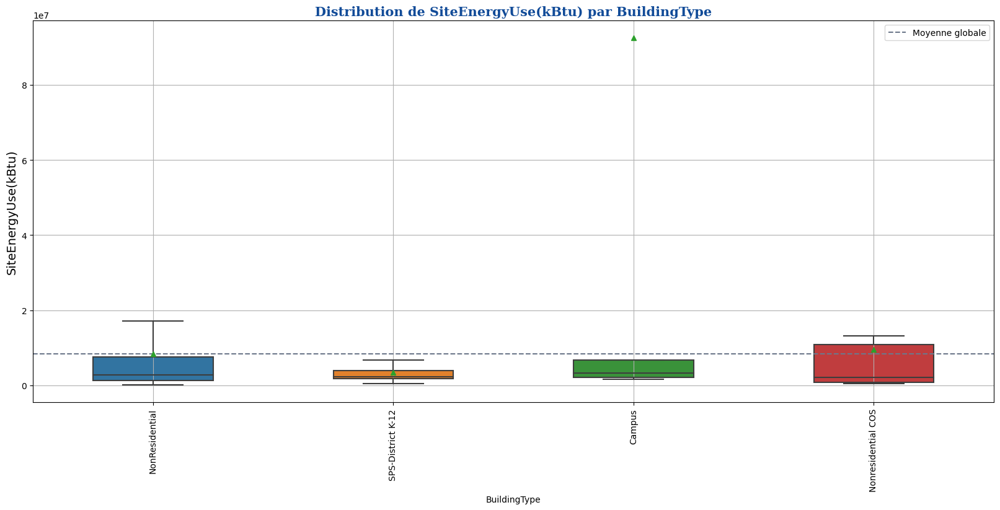

,Source,ddof1,H,p-unc
Kruskal,BuildingType,3,1.248809,0.741323


,Campus,NonResidential,Nonresidential COS,SPS-District K-12
Campus,1.000000,1.000000,1.000000,1.000000
NonResidential,1.000000,1.000000,1.000000,1.000000
Nonresidential COS,1.000000,1.000000,1.000000,1.000000
SPS-District K-12,1.000000,1.000000,1.000000,1.000000


------------------------------------

#### Liaison entre  : SiteEnergyUse(kBtu)  et ComplianceStatus

------------------------------------

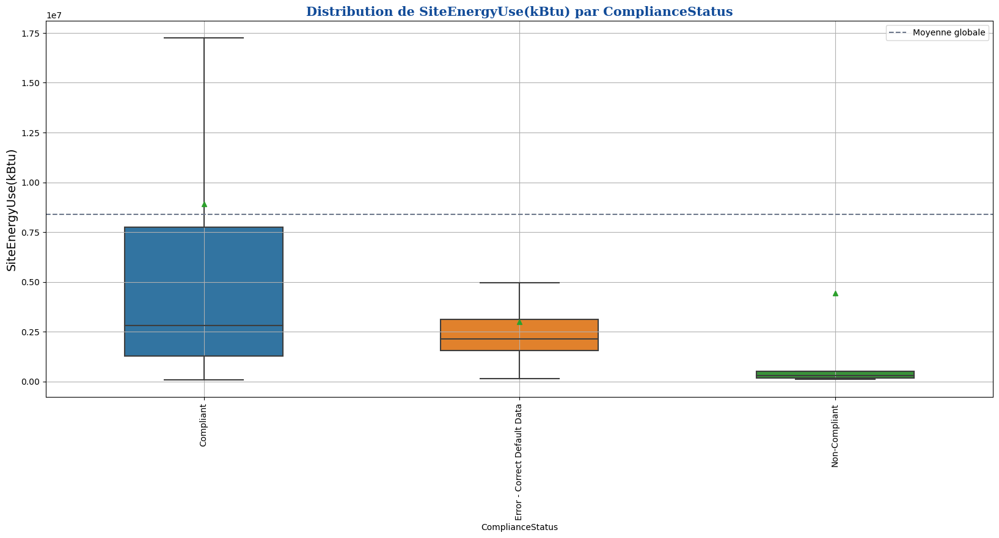

,Source,ddof1,H,p-unc
Kruskal,ComplianceStatus,2,14.229759,0.000813


,Compliant,Error - Correct Default Data,Non-Compliant
Compliant,1.000000,0.067000,0.007000
Error - Correct Default Data,0.067000,1.000000,0.084000
Non-Compliant,0.007000,0.084000,1.000000


------------------------------------

#### Liaison entre  : SiteEnergyUse(kBtu)  et PrimaryPropertyType

------------------------------------

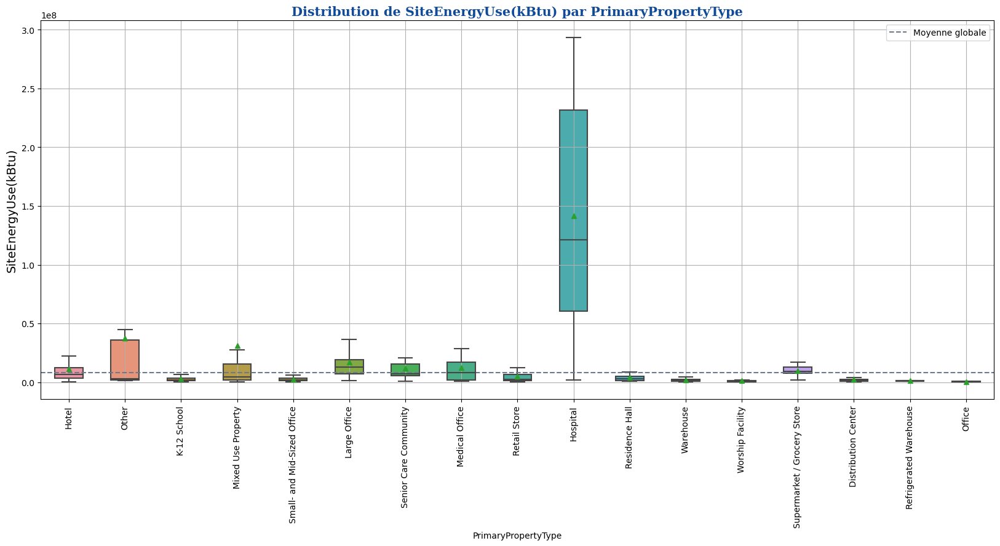

,Source,ddof1,H,p-unc
Kruskal,PrimaryPropertyType,16,555.357328,6.593299e-108


,Distribution Center,Hospital,Hotel,K-12 School,Large Office,Medical Office,Mixed Use Property,Office,Other,Refrigerated Warehouse,Residence Hall,Retail Store,Senior Care Community,Small- and Mid-Sized Office,Supermarket / Grocery Store,Warehouse,Worship Facility
Distribution Center,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.020000,1.000000,0.199000,1.000000,1.000000,0.809000,0.000000,1.000000,0.000000,1.000000,1.000000
Hospital,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.279000,0.001000,1.000000,0.005000,0.014000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
Hotel,0.000000,1.000000,1.000000,0.000000,0.184000,1.000000,1.000000,0.037000,1.000000,0.247000,0.969000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
K-12 School,1.000000,0.000000,0.000000,1.000000,0.000000,0.011000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.012000,1.000000,0.000000,0.000000,0.000000
Large Office,0.000000,1.000000,0.184000,0.000000,1.000000,0.268000,0.048000,0.001000,1.000000,0.004000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
Medical Office,0.000000,1.000000,1.000000,0.011000,0.268000,1.000000,1.000000,0.095000,1.000000,0.704000,1.000000,0.074000,1.000000,0.000000,1.000000,0.000000,0.000000
Mixed Use Property,0.020000,0.279000,1.000000,1.000000,0.048000,1.000000,1.000000,0.450000,1.000000,1.000000,1.000000,1.000000,1.000000,0.218000,1.000000,0.000000,0.000000
Office,1.000000,0.001000,0.037000,1.000000,0.001000,0.095000,0.450000,1.000000,0.494000,1.000000,1.000000,1.000000,0.034000,1.000000,0.005000,1.000000,1.000000
Other,0.199000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.494000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.017000,0.000000
Refrigerated Warehouse,1.000000,0.005000,0.247000,1.000000,0.004000,0.704000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.243000,1.000000,0.025000,1.000000,1.000000


------------------------------------

#### Liaison entre  : SiteEnergyUse(kBtu)  et Neighborhood

------------------------------------

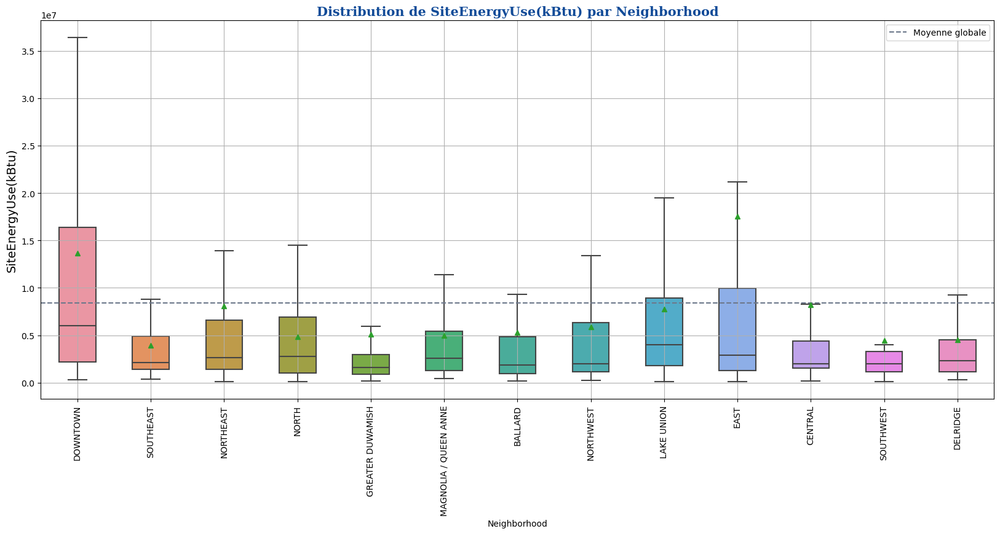

,Source,ddof1,H,p-unc
Kruskal,Neighborhood,12,136.688337,2.788061e-23


,BALLARD,CENTRAL,DELRIDGE,DOWNTOWN,EAST,GREATER DUWAMISH,LAKE UNION,MAGNOLIA / QUEEN ANNE,NORTH,NORTHEAST,NORTHWEST,SOUTHEAST,SOUTHWEST
BALLARD,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.723000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
CENTRAL,1.000000,1.000000,1.000000,0.015000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
DELRIDGE,1.000000,1.000000,1.000000,0.010000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
DOWNTOWN,0.000000,0.015000,0.010000,1.000000,0.153000,0.000000,0.486000,0.000000,0.033000,0.000000,0.000000,0.004000,0.004000
EAST,1.000000,1.000000,1.000000,0.153000,1.000000,0.002000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
GREATER DUWAMISH,1.000000,1.000000,1.000000,0.000000,0.002000,1.000000,0.000000,0.107000,1.000000,0.031000,1.000000,1.000000,1.000000
LAKE UNION,0.723000,1.000000,1.000000,0.486000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
MAGNOLIA / QUEEN ANNE,1.000000,1.000000,1.000000,0.000000,1.000000,0.107000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
NORTH,1.000000,1.000000,1.000000,0.033000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
NORTHEAST,1.000000,1.000000,1.000000,0.000000,1.000000,0.031000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [95]:
for Qvar in category_features+['PrimaryPropertyType','Neighborhood']:
    realtionQantiQuali(dfBuild,'SiteEnergyUse(kBtu)',Qvar)

In [96]:
for Qvar in category_features:
    kruskallWallisTest(dfBuild,'SiteEnergyUse(kBtu)',Qvar)

,Source,ddof1,H,p-unc
Kruskal,BuildingType,3,1.248809,0.741323


,Campus,NonResidential,Nonresidential COS,SPS-District K-12
Campus,1.000000,1.000000,1.000000,1.000000
NonResidential,1.000000,1.000000,1.000000,1.000000
Nonresidential COS,1.000000,1.000000,1.000000,1.000000
SPS-District K-12,1.000000,1.000000,1.000000,1.000000


,Source,ddof1,H,p-unc
Kruskal,ComplianceStatus,2,14.229759,0.000813


,Compliant,Error - Correct Default Data,Non-Compliant
Compliant,1.000000,0.067000,0.007000
Error - Correct Default Data,0.067000,1.000000,0.084000
Non-Compliant,0.007000,0.084000,1.000000


In [97]:
# for Qvar in quali_features:
#     kruskallWallisTest(dfBuild,'SiteEnergyUse(kBtu)',Qvar)

### scatter plot

In [98]:
def scatterPlot(data, var,figsize=(8,3)):
    fig = plt.figure(figsize=figsize)
    #  subplot #1
    plt.subplot(121)
    plt.title('TotalGHGEmissions', fontdict=font_title2)
    sns.scatterplot(y = data['TotalGHGEmissions'],x = data[var],color='coral')
    plt.xticks(size=8)
    plt.yticks(size=8)
    plt.xlabel(var, size=8)
    plt.ylabel('TotalGHGEmissions', size=8)
    #  subplot #2
    plt.subplot(122)
    plt.title('SiteEnergyUse(kBtu', fontdict=font_title2)
    sns.scatterplot(y = data['SiteEnergyUse(kBtu)'],x = data[var],color='blue')
    plt.xticks(size=8)
    plt.yticks(size=8)
    plt.xlabel(var, size=8)
    plt.ylabel('SiteEnergyUse(kBtu)', size=8)
    plt.tight_layout()
    plt.show()

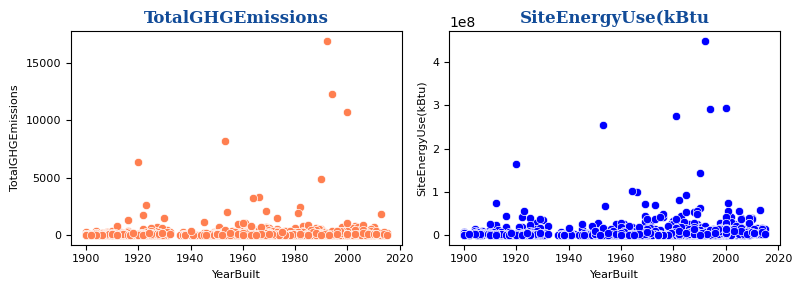

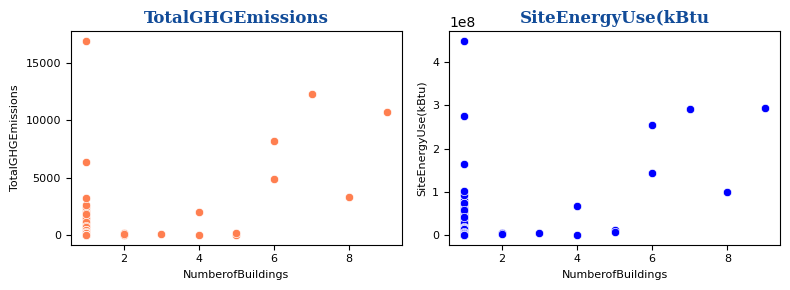

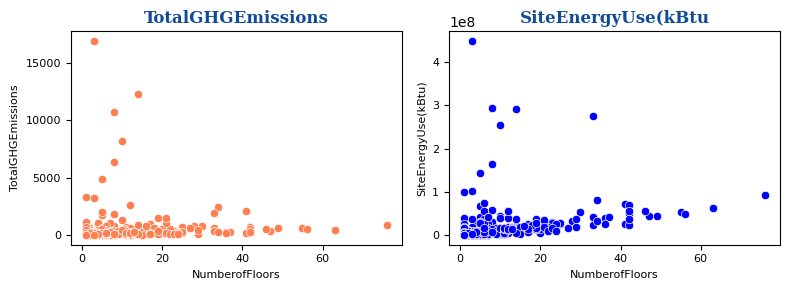

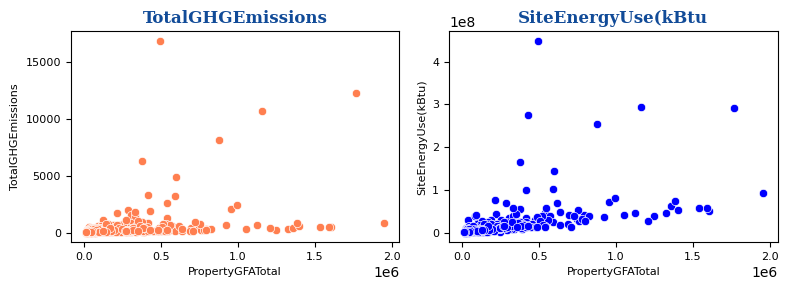

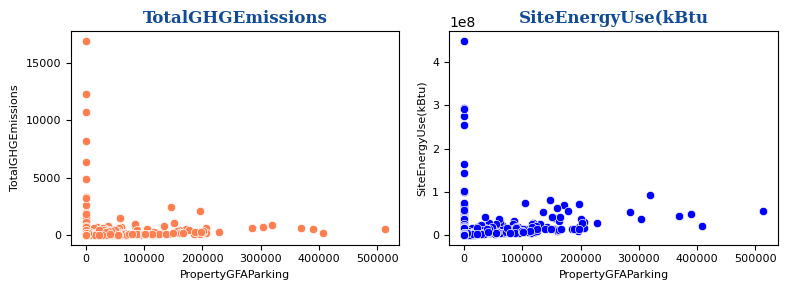

...

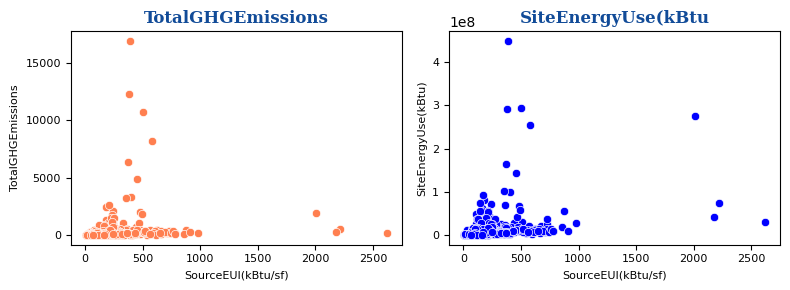

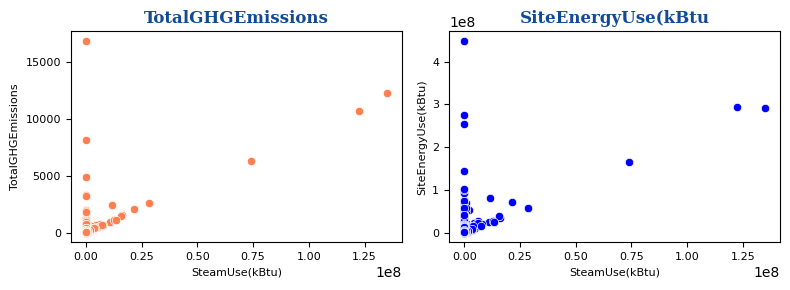

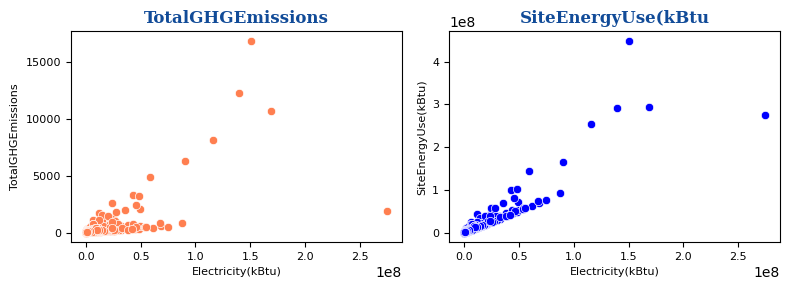

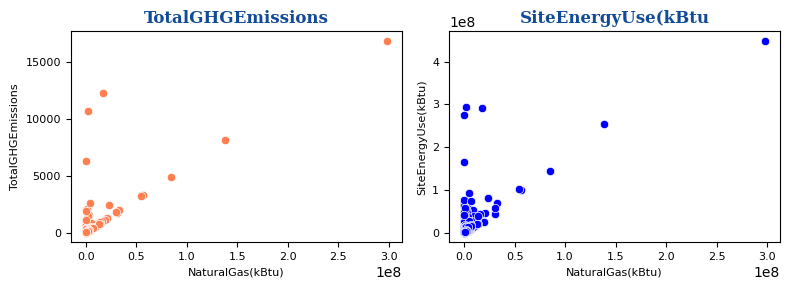

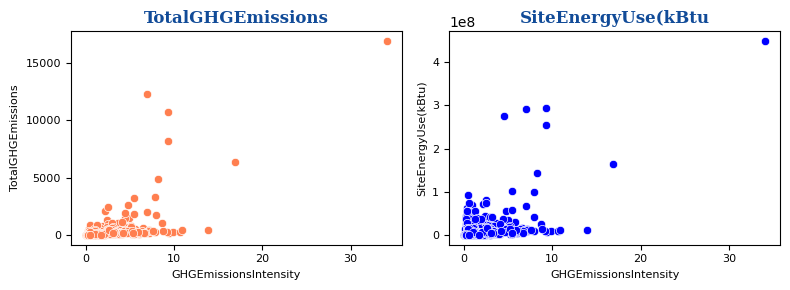

In [99]:
varlistGraph=['YearBuilt','NumberofBuildings', 'NumberofFloors','PropertyGFATotal', 'PropertyGFAParking', 
              'PropertyGFABuilding(s)','LargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 
              'SourceEUI(kBtu/sf)', 'SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 'GHGEmissionsIntensity']
for var in varlistGraph: # numeric_features    
    scatterPlot(dfBuild, var)

## <a id='2'> <font color='#114b98' font-size='110%' text-align='left'>5 - Features engineering  </font> </font> </a>
-----------
[Back to table of content](#-1) <br>

Nous allons nous interesser aux sources d'energie. __'SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 'OtherFuelUse(kBtu)'__
    
La variable 'OtherFuelUse(kBtu)' est supprimée de la base.
    
Nous allons créer des variables binaires avec les autres sources d'énergie:
    
- __1 : énergie utilisée sous cette forme__
- __0 : énergie non utilisée sous cette forme.__

In [100]:
cols=['SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(kBtu)']
Newcols=['FE_SteamUse','FE_Electricity','FE_NaturalGas']

from sklearn.preprocessing import Binarizer
for col,colnew in zip(cols,Newcols):
    dfBuild[colnew]=dfBuild[col]

for col,colnew in zip(cols,Newcols):
    dfBuild[Newcols] = Binarizer().fit_transform(dfBuild[Newcols]) 
    
dfBuild.head()

,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,...,NaturalGas(kBtu),DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity,BuildAge,BuildAgeGroup,FE_SteamUse,FE_Electricity,FE_NaturalGas
0,NonResidential,Hotel,MAYFLOWER PARK HOTEL,405 Olive way,7,DOWNTOWN,47.61220,-122.33799,1927,1,...,1276453.0,False,Compliant,249.98,2.83,89,"(80, 90]",1.0,1.0,1.0
1,NonResidential,Hotel,PARAMOUNT HOTEL,724 Pine street,7,DOWNTOWN,47.61317,-122.33393,1996,1,...,5145082.0,False,Compliant,295.86,2.86,20,"(10, 20]",0.0,1.0,1.0
2,NonResidential,Hotel,5673-THE WESTIN SEATTLE,1900 5th Avenue,7,DOWNTOWN,47.61393,-122.33810,1969,1,...,1493800.0,False,Compliant,2089.28,2.19,47,"(40, 50]",1.0,1.0,1.0
3,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,7,DOWNTOWN,47.61412,-122.33664,1926,1,...,1811213.0,False,Compliant,286.43,4.67,90,"(80, 90]",1.0,1.0,1.0
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,7,DOWNTOWN,47.61375,-122.34047,1980,1,...,8803998.0,False,Compliant,505.01,2.88,36,"(30, 40]",0.0,1.0,1.0


#### <font color='#337da4' font-size='90%' text-align='left'> Nombre de type d'usages </font>

----------

In [101]:
def split_words(df, column = None):
    list_words = set()
    for word in df[column].str.split(','):
        if isinstance(word, float):
            continue
        list_words = set().union(word, list_words)
    return list(list_words)

listeUsages = split_words(dfBuild, 'ListOfAllPropertyUseTypes')
print("Nombre de type d'usages dans la base : {}".format(len(listeUsages)))

Nombre de type d'usages dans la base : 74


In [102]:
dfBuild['FE_NumberOfUseType'] = [str(word).count(",") + 1 for word in dfBuild['ListOfAllPropertyUseTypes'].str.split(',')]
dfBuild.head()

,BuildingType,PrimaryPropertyType,PropertyName,Address,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,...,DefaultData,ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity,BuildAge,BuildAgeGroup,FE_SteamUse,FE_Electricity,FE_NaturalGas,FE_NumberOfUseType
0,NonResidential,Hotel,MAYFLOWER PARK HOTEL,405 Olive way,7,DOWNTOWN,47.61220,-122.33799,1927,1,...,False,Compliant,249.98,2.83,89,"(80, 90]",1.0,1.0,1.0,1
1,NonResidential,Hotel,PARAMOUNT HOTEL,724 Pine street,7,DOWNTOWN,47.61317,-122.33393,1996,1,...,False,Compliant,295.86,2.86,20,"(10, 20]",0.0,1.0,1.0,3
2,NonResidential,Hotel,5673-THE WESTIN SEATTLE,1900 5th Avenue,7,DOWNTOWN,47.61393,-122.33810,1969,1,...,False,Compliant,2089.28,2.19,47,"(40, 50]",1.0,1.0,1.0,1
3,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,7,DOWNTOWN,47.61412,-122.33664,1926,1,...,False,Compliant,286.43,4.67,90,"(80, 90]",1.0,1.0,1.0,1
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,7,DOWNTOWN,47.61375,-122.34047,1980,1,...,False,Compliant,505.01,2.88,36,"(30, 40]",0.0,1.0,1.0,3


#### <font color='#337da4' font-size='90%' text-align='left'> Part des surfaces </font>

----------

In [103]:
dfBuild['FE_PartLargestUseGFA'] = dfBuild['LargestPropertyUseTypeGFA']/dfBuild['PropertyGFATotal']

In [104]:
dfBuild['FE_PartGFABuilding'] = (round((dfBuild['PropertyGFABuilding(s)'].fillna(0)/dfBuild['PropertyGFATotal'].fillna(0)),5))
dfBuild['FE_PartGFAParking'] = (round((dfBuild['PropertyGFAParking'].fillna(0) /dfBuild['PropertyGFATotal'].fillna(0)),5))

In [105]:
dfBuild['FE_GFAPerBuilding'] = round((dfBuild['PropertyGFATotal'] / dfBuild['NumberofBuildings']),2)
dfBuild['FE_GFAPerFloor'] = round((dfBuild['PropertyGFATotal'] / dfBuild['NumberofFloors']),2)

In [106]:
dfBuild[['NumberofBuildings','NumberofFloors']].describe()

,NumberofBuildings,NumberofFloors
count,1085.000000,1085.000000
mean,1.046083,4.757604
std,0.483773,7.260395
min,1.000000,1.000000
25%,1.000000,1.000000
50%,1.000000,3.000000
75%,1.000000,5.000000
max,9.000000,76.000000


<AxesSubplot: >

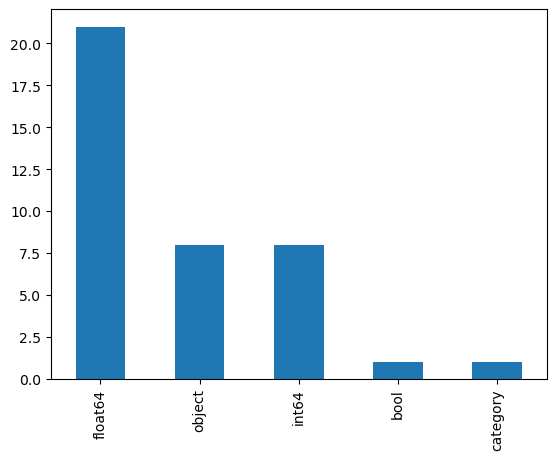

In [107]:
dfBuild.dtypes.value_counts().plot(kind='bar')


 
### <font color='#337da4' font-size='100%' text-align='left'> Exportation des données en fichier csv </font>

----------

In [108]:
dfBuild.to_csv('dfBuild.csv', index=False)